# Analysis of the SisFall Dataset for Fall Detection
#### A dataset of performed trials of activities of daily living (ADLs) and falls with subjects wearing two triaxis accelerometers and a gyroscope.

## Matthew Johnson
#### July 25, 2018


SisFall Dataset: http://sistemic.udea.edu.co/en/investigacion/proyectos/english-falls/<br>
##### Sources: <br>
* [1] **Automatic Fall Monitoring: A Review**<br>
  *Natthapon Pannurat, Surapa Thiemjarus, and Ekawit Nantajeewarawat*
* [2] **Real-life/real-time elderly fall detection with a triaxial accelerometer**<br>
 *A. Sucerquia, J.D. López and J.F. Vargas-Bonilla*
* [3] **SisFall: A Fall and Movement Dataset**<br>
 *A. Sucerquia, J.D. López and J.F. Vargas-Bonilla*
* [4] **Fall-Detection Algorithm Using 3-Axis Acceleration: Combination with Simple Threshold and Hidden Markov Model**<br>
 *Dongha Lim, Chulho Park, Nam Ho Kim, Sang-Hoon Kim, and Yun Seop Yu*

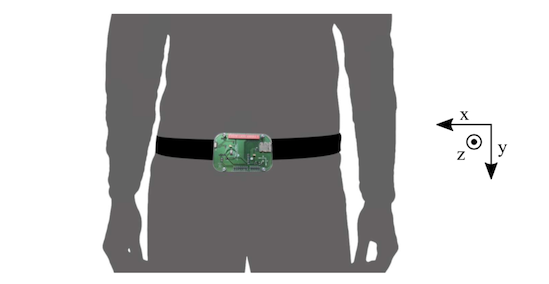

In [819]:
from IPython.display import Image
Image(filename='/Users/mattjohnson/Desktop/Python 2018/Untitled Folder/img5.png') # [3] 

## Activities of Daily Living (ADLs):

-----------

| Code | Activity | # trials | length of trial |
---|---|---
| D01  | Walking slowly | 1      | 100s     |
| D02  | Walking quickly | 1      | 100s     |
| D03  | Jogging slowly | 1      | 100s     |
| D04  | Jogging quickly | 1      | 100s     |
| D05  | Walking upstairs and downstairs slowly | 5      | 25s      |
| D06  | Walking upstairs and downstairs quickly | 5      | 25s      |
| D07  | Slowly sit in a half height chair, wait a moment, and up slowly | 5      | 12s      |
| D08  | Quickly sit in a half height chair, wait a moment, and up quickly | 5      | 12s|
| D09  | Slowly sit in a low height chair, wait a moment, and up slowly | 5      | 12s      |
| D10  | Quickly sit in a low height chair, wait a moment, and up quickly| 5      | 12s      |
| D11  | Sitting a moment, trying to get up, and collapse into a chair| 5      | 12s      |
| D12  | Sitting a moment, lying slowly, wait a moment, and sit again | 5      | 12s      |
| D13  | Sitting a moment, lying quickly, wait a moment, and sit again | 5      | 12s      |
| D14  | Being on oneís back change to lateral position, wait a moment, and change to oneís back  | 5      | 12s      |
| D15  | Standing, slowly bending at knees, and getting up | 5      | 12s      |
| D16  | Standing, slowly bending without bending knees, and getting up | 5      | 12s      |
| D17  | Standing, get into a car, remain seated and get out of the car | 5      | 25s      |
| D18  | Stumble while walking | 5      | 12s      |
| D19  | Gently jump without falling (trying to reach a high object)| 5      | 12s      |

## Falls:

-----------

| Code | Activity | # trials | length of trial |
---|---|---
| F01  | Fall forward while walking caused by a slip| 5      | 15s      |
| F02  | Fall backward while walking caused by a slip| 5      | 15s      |
| F03  | Lateral fall while walking caused by a slip| 5      | 15s      |
| F04  | Fall forward while walking caused by a trip| 5      | 15s      |
| F05  | Fall forward while jogging caused by a trip| 5      | 15s      |
| F06  | Vertical fall while walking caused by fainting | 5      | 15s      |
| F07  | Fall while walking, with use of hands in a table to dampen fall, caused by fainting| 5      | 15s      |
| F08  | Fall forward when trying to get up| 5      | 15s      |
| F10  | Fall forward when trying to sit down | 5      | 15s      |
| F11  | Fall backward when trying to sit down | 5      | 15s      |
| F09  | Lateral fall when trying to get up | 5      | 15s      |
| F12  | Lateral fall when trying to sit down | 5      | 15s      |
| F13  | Fall forward while sitting, caused by fainting or falling asleep| 5      | 15s      |
| F14  | Fall backward while sitting, caused by fainting or falling asleep| 5      | 15s |
| F15  | Lateral fall while sitting, caused by fainting or falling asleep| 5      | 15s      |

#### Subjects SA01-SA09:

-----------

| Subject | Age | Height | Weight | Gender |
---|---|---
| SA01    | 26  | 165    | 53     | F      |
| SA02    | 23  | 176    | 58.5   | M      |
| SA03    | 19  | 156    | 48     | F      |
| SA04    | 23  | 170    | 72     | M      |
| SA05    | 22  | 172    | 69.5   | M      |
| SA06    | 21  | 169    | 58     | M      |
| SA07    | 21  | 156    | 63     | F      |
| SA08    | 21  | 149    | 41.5   | F      |
| SA09    | 24  | 165    | 64     | M      |

#### For computational reasons I currently only have the first 3 subject's data loaded up:

In [3]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import glob
import time
warnings.filterwarnings('ignore')

path = '/Users/mattjohnson/Desktop/Python 2018/Untitled Folder/SubjectDataFrames/acm_SA0'

subjectList = []

for i in range(1,4):
    data = pd.read_csv(path + str(i) + '.csv')
    data = data.drop('Unnamed: 0', axis=1)
    df = data[ ['x1', 'y1', 'z1', 'x2', 'y2', 'z2','activity', 'subject', 'trial']]
    subjectList.append(df)

In [4]:
# Codes for ADLs
dailies = ['D01','D02','D03','D04','D05','D06','D07','D08','D09','D10','D11','D12','D13','D14','D15',
 'D16','D17','D18','D19']
# Codes for Falls
falls = ['F01','F02','F03','F04','F05','F06','F07','F08','F09','F10','F11','F12','F13','F14','F15']

# Lists to hold dataframes sorted by activity (ADLs and Falls)
adl_list = []
fall_list = []
# Iterate through subject data and sort into ADLs and Falls
for s in subjectList:
    for d in dailies:
        tempdf = s[ s['activity']==d]
        adl_list.append(tempdf)
    
    for f in falls:
        tempdf = s[ s['activity']==f]
        fall_list.append(tempdf)

In [5]:
# Titles for fall activities
fall_titles = ['Fall forward while walking caused by a slip', 'Fall backward while walking caused by a slip', 
    'Lateral fall while walking caused by a slip', 'Fall forward while walking caused by a trip', 
    'Fall forward while jogging caused by a trip', 'Vertical fall while walking caused by fainting',
    'Fall while walking, with use of hands in a table to dampen fall, caused by fainting',
    'Fall forward when trying to get up', 'Lateral fall when trying to get up', 
    'Fall forward when trying to sit down', 'Fall backward when trying to sit down', 'Lateral fall when trying to sit down',
    'Fall forward while sitting, caused by fainting or falling asleep',
    'Fall backward while sitting, caused by fainting or falling asleep',
    'Lateral fall while sitting, caused by fainting or falling asleep']
# Titles for ADLs
adl_titles = ['Walking slowly', 'Walking quickly', 'Jogging slowly', 'Jogging quickly', 'Walking upstairs and downstairs slowly',
    'Walking upstairs and downstairs quickly','Slowly sit in a half height chair, wait a moment, and up slowly',
    'Quickly sit in a half height chair, wait a moment, and up quickly',
    'Slowly sit in a low height chair, wait a moment, and up slowly','Quickly sit in a low height chair, wait a moment, and up quickly',
    'Sitting a moment, trying to get up, and collapse into a chair',
    'Sitting a moment, lying slowly, wait a moment, and sit again','Sitting a moment, lying quickly, wait a moment, and sit again',
    'Being on oneís back change to lateral position, wait a moment, and change to oneís back',
    'Standing, slowly bending at knees, and getting up', 'Standing, slowly bending without bending knees, and getting up',
    'Standing, get into a car, remain seated and get out of the car','Stumble while walking',
    'Gently jump without falling (trying to reach a high object)']

#### Plotting and filter methods:

- get_trial_time(index, kind)
- plot_trials(index, kind)
- plot_one_from_each(index, kind)
- plot_feats(index, kind)
- plot_trial(index, trialIndex, kind)

In [223]:
dailies = ['D01','D02','D03','D04','D05','D06','D07','D08','D09','D10','D11','D12','D13','D14','D15',
 'D16','D17','D18','D19']
falls = ['F01','F02','F03','F04','F05','F06','F07','F08','F09','F10','F11','F12','F13','F14','F15']

fs = 200.0 # frequency samplet
subjectCodes = ['SA01', 'SA02', 'SA03']

def get_trial_time(index, kind):
    
    r=5
    if kind == 'f':
        n = 3000.0
        t = np.linspace(0, 15.0,n, endpoint=False)
    else:
        if index in list(range(0,4)):
            T = 100 # seconds
        elif index in [4, 5, 16]:
            T = 25 
        else: T = 12
        
        n = int(T * fs) # total number of samples
        t = np.linspace(0, T, n, endpoint=False)
                
        if index <= 3: 
            r = 1 
                    
    return t, int(n), int(r)
    
## index w <-- activity = F[w+1], eg. index=4 gives a df that contains activity F05 
## This makes sense since data_list[0] contains activity F01

def plot_trials(index, subjectIndex, kind):
    
    if kind == 'f': 
        correctList, correctTitles, correctCodes = fall_df_list, fall_titles, falls
    else: 
        correctList, correctTitles, correctCodes = adl_df_list, adl_titles, dailies
                
    new_df = correctList[index+15*subjectIndex]
    t, n, r = get_trial_time(index, kind)
    
    T = int(n/fs)
    l = list( range(0, int(1000*T), int(1000*0.625)))
    l = np.array(l)/1000
    xcoords = list(l)
    
    plt.figure(figsize=( 15, 2*r))

    for i in range(0,r):
        curr_df = new_df[i*n:i*n+n]
        if len(curr_df) != 0:
            if len(curr_df) != n:
                curr_df = curr_df.append(curr_df.iloc[len(curr_df)-1])
            plt.subplot(r, 1, i+1)
            plt.plot(t, curr_df['fx'], 'b-', label='x')
            plt.plot(t, curr_df['fy'], 'r-', label='y')
            plt.plot(t, curr_df['fz'], 'y-', label='z')
            for xc in xcoords:
                plt.axvline(x=xc)
            plt.grid()
            labs = list(range(0,len(xcoords)-2))
            plt.xticks(xcoords, labs)
            plt.legend()
            plt.ylabel('trial'+ str(i+1))
            if i == 0: 
                plt.title( subjectCodes[subjectIndex] + ' - '+ correctCodes[index] + ':' + correctTitles[index] )

        if kind=='f':
            tempA = FTL[5*index+i+75*subjectIndex]
            if len(tempA)>0:
                shadeStart = tempA[0]
                shadeFin = tempA[len(tempA)-1]+2
                plt.axvspan(shadeStart*.625, shadeFin*.625, color='red', alpha=0.5)
        
    plt.subplots_adjust(hspace=0.35)
    plt.show()
    
def plot_one_from_each(index, kind):
    
    if kind == 'f': 
        correctList, correctTitles, correctCodes = fall_df_list, fall_titles, falls
    else: 
        correctList, correctTitles, correctCodes = adl_df_list, adl_titles, dailies
            
    plt.figure(figsize=(15,10))
        
    for i in range(0,5):
        if (index+i+1)==len(correctList): return
        new_df = correctList[index+i]
        t, n, r = get_trial_time(index, kind)

        try:
            curr_df = new_df[0:n]
            if len(curr_df) != n:
                curr_df = curr_df.append(curr_df.iloc[len(curr_df)-1])
            plt.subplot(5, 1, i+1)
            plt.plot(t, curr_df['bx'], 'b-', label='x')
            plt.plot(t, curr_df['by'], 'r-', label='y')
            plt.plot(t, curr_df['bz'], 'y-', label='z')
            plt.grid()
            plt.legend()
            plt.ylabel('Acc')
            plt.title( correctCodes[index + i] + ' ' + correctTitles[index + i])
        except:
            print('')
            
    plt.subplots_adjust(hspace=0.4)
    plt.show()    
    
def plot_feats(index, tri, kind):

    if kind == 'f': 
        correctList, correctTitles, correctCodes = fall_df_list, fall_titles, falls
    else: 
        correctList, correctTitles, correctCodes = adl_df_list, adl_titles, dailies
        
    t, n, r = get_trial_time(index, kind)
    
    new_df = correctList[index]
    curr_df = new_df[tri*n:tri*n+n]

    feat_list = ['vector_mag', 'vector_mag2', 'horiz_mag', 'vert', 'std_mag9', 'horiz_std_mag9',
                 'peak_diff', 'HorizSigMagArea', 'angle_from_horiz', 'gyro_horiz_std_mag']
    colour_list = ['b-', 'r-', 'k-', 'c-', 'C2', 'C4', 'C1', 'C5', 'C6', 'C7']

    x = len(feat_list)
    plt.figure(figsize=(15,2*x))
    
    for i, feat, colour in zip(range(0,x), feat_list, colour_list):
        plt.subplot(x, 1, i+1)
        plt.plot(t, curr_df[feat], colour, label=feat)
        plt.grid()
        plt.legend()
        plt.ylabel(feat)
        if i==0: plt.title( correctCodes[index] + ' ' + correctTitles[index])

    plt.subplots_adjust(hspace=0.35)
    plt.show() 
    
def plot_trial(index, tri, kind):
    
    if kind == 'f': 
        correctList, correctTitles, correctCodes = fall_df_list, fall_titles, falls
    else: 
        correctList, correctTitles, correctCodes = adl_df_list, adl_titles, dailies
                
    new_df = correctList[index]
    
    t, n, r = get_trial_time(index, kind)
    plt.figure(figsize=( 15, 24))

    xtypes = ['ax', 'fx', 'bx', 'gx']
    ytypes = ['ay', 'fy', 'by', 'gy']
    ztypes = ['az', 'fz', 'bz', 'gz']
    ylabs = ['raw acc (m/s^2)', 'filtered', 'filt differential', 'gyro']
    for i in range(0,len(xtypes)):
        curr_df = new_df[tri*n:tri*n+n]
        if len(curr_df) != n:
            curr_df = curr_df.append(curr_df.iloc[len(curr_df)-1])
        plt.subplot(12, 1, i+1)
        plt.plot(t, curr_df[xtypes[i]], 'b-', label='x')
        plt.plot(t, curr_df[ytypes[i]], 'r-', label='y')
        plt.plot(t, curr_df[ztypes[i]], 'y-', label='z')
        plt.grid()
        plt.legend()
        plt.ylabel(ylabs[i])
        if i == 0: plt.title( correctCodes[index] + ' ' + correctTitles[index])

    curr_df = correctList[index][0:int(n)]
    if len(curr_df) != n:
            curr_df = curr_df.append(curr_df.iloc[len(curr_df)-1])
            
    feat_list = ['vector_mag', 'vector_mag2', 'horiz_mag', 'vert', 'std_mag9', 'horiz_std_mag9', 
                 'peak_diff', 'HorizSigMagArea', 'angle_from_horiz', 'gyro_horiz_std_mag']
    colour_list = ['b-', 'r-', 'k-', 'c-', 'C2', 'C4', 'C1', 'C5', 'C6', 'C7']

    x = len(feat_list) + len(xtypes)
    plt.figure(figsize=(15,2*x))
    
    for i, feat, colour in zip(range(0,x), feat_list, colour_list):
        plt.subplot(12, 1, i+1)
        plt.plot(t, curr_df[feat], colour, label=feat)
        plt.grid()
        plt.legend()
        plt.ylabel(feat)
        if i==0: plt.title( correctCodes[index] + ' ' + correctTitles[index])

    plt.subplots_adjust(hspace=0.35)
    plt.show()
    
from scipy.signal import butter, lfilter, freqz
# Filter requirements.
order = 4
fs = 200.0       # sample rate, Hz
cutoff = 5.0  # desired cutoff frequency of the filter, Hz

# From??????
def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

#### Data preparation methods:

- sliding_window(dataframe, kind) [very time consuming]
- prepare_data(kind)

#### Features:<br>
- Sum Vector Magnitude
- Horizontal Sum Vector Magnitude
- Rolling standard deviation magnitude
- Angle from horizontal
- more

In [157]:
# Codes for trials
trials = ['R01', 'R02', 'R03', 'R04', 'R05']
horiz_std_mag_THRESHOLD = 170      # Set threshold for Horizontal Standard Deviation Magnitude
horiz_vec_mag_THRESHOLD = 400      # Set threshold for Horizontal Sum Vector Magnitude
vector_mag_THRESHOLD = 900         # Set threshold for Sum Vector Magnitude
gyro_horiz_std_THRESHOLD = 170

# Lists to hold prepared fall and ADL dataframes
fall_df_list = []
adl_df_list = []
# Lists to hold sliding windows of 1.25s with a 50% overlap
windowList_adl = []
windowList_fall = []

windowHighlights_adl = []
falseAlarms = []

# Method that takes in a dataframe and kind=['f', 'a'] and stores sliding windows of 1.25s 
# with a 50% overlap
def sliding_window(dataframe, kind):           
    k=0
    for i in range(0, len(dataframe)-256, 128):
        w = 256 # Size of sliding window (256 points at 200Hz = 1.25 seconds)
        w1 = dataframe.iloc[i:i+w][:] 
        
        if ((w1['horiz_std_mag9'].max() >= horiz_std_mag_THRESHOLD)*1 + (w1['horiz_vector_mag9'].max() >= horiz_vec_mag_THRESHOLD)*1
           + (w1['vm'].max() >= vector_mag_THRESHOLD)*1 + (w1['gyro_horiz_std_mag'].max() >= gyro_horiz_std_THRESHOLD)*1 >= 3 ):
            w1['Fall'] = 1
            
            if kind == 'a':
                falseAlarms.append(k)
                print('k:', k, 'i:', i, '\n')
                print('False Alarm: hstd9:', w1['horiz_std_mag9'].max(), 'hvm9:', w1['horiz_vector_mag9'].max())
                print('\tvm:', w1['vm'].max(), 'hvm9:', 'ghstd:', w1['gyro_horiz_std_mag'].max())
                windowHighlights_adl.append(1)
        else: 
            w1['Fall'] = 0
            if kind == 'a':
                windowHighlights_adl.append(0)
        
        if kind=='f': # If fall
            windowList_fall.append(w1)
        else:  # If ADL
            windowList_adl.append(w1)
        k+=1

# Method that takes in a kind=['f', 'a'] and prepares respective data
def prepare_data(kind):
        
    if kind == 'f': # If fall 
            putList, takeList = fall_df_list, fall_list
    else:  # If ADL
            putList, takeList = adl_df_list, adl_list
        
    start = time.time() # Timer for testing
    
    for i in range(0,len(takeList)): # Iterate through the takeList (fall_list or adl_list)
        
        my_df = takeList[i].copy() # copy dataframe from list
        new_df = pd.DataFrame() # placeholder
    
        for trial in trials: # Iterate through trials (1-5)
    
            # Get relevant trial data
            trial_df = my_df[ my_df['trial']==trial ]
            
            tempdf = pd.DataFrame() # dataframe for putting into filter
            # Low Pass Buttersworth Filter and remove bias
            tempdf['ax'], tempdf['ay'], tempdf['az'] = trial_df['x1'], trial_df['y1'], trial_df['z1']
            tempdf = tempdf.reset_index(drop=True)
            tempdf['fx'] = pd.Series(butter_lowpass_filter( trial_df['x1'], cutoff, fs, order))
            tempdf['fy'] = pd.Series(butter_lowpass_filter( trial_df['y1'], cutoff, fs, order))
            tempdf['fz'] = pd.Series(butter_lowpass_filter( trial_df['z1'], cutoff, fs, order))
            tempdf['bx'] = tempdf['fx'].diff()
            tempdf['by'] = tempdf['fy'].diff()
            tempdf['bz'] = tempdf['fz'].diff()

            tempdf = tempdf.reset_index(drop=True)
            trial_df = trial_df.reset_index(drop=True)
            tempdf['gx'], tempdf['gy'], tempdf['gz'] = trial_df['x2'], trial_df['y2'], trial_df['z2']

            # Rolling averages
            tempdf['y_roll'] = pd.Series(tempdf['by'].rolling(200).mean())
            tempdf['fy_roll'] = pd.Series(tempdf['fy'].rolling(200).mean())
            tempdf['gy_roll'] = pd.Series(tempdf['by'].rolling(200).mean())            
            
            # Rolling standard deviations
            tempdf['bx_std'] = pd.rolling_std(tempdf['bx'], 200)
            tempdf['by_std'] = pd.rolling_std(tempdf['by'], 200)
            tempdf['bz_std'] = pd.rolling_std(tempdf['bz'], 200)
            tempdf['fx_std'] = pd.rolling_std(tempdf['fx'], 200)
            tempdf['fy_std'] = pd.rolling_std(tempdf['fy'], 200)
            tempdf['fz_std'] = pd.rolling_std(tempdf['fz'], 200)
            tempdf['gx_std'] = pd.rolling_std(tempdf['fx'], 200)
            tempdf['gy_std'] = pd.rolling_std(tempdf['fy'], 200)
            tempdf['gz_std'] = pd.rolling_std(tempdf['fz'], 200)
        
            # Integral stuff
            tempdf['xsum'] = pd.expanding_sum(((abs(tempdf['ax']).rolling(2).sum()/2)*(1/200)).fillna(0))
            tempdf['ysum'] = pd.expanding_sum(((abs(tempdf['ay']).rolling(2).sum()/2)*(1/200)).fillna(0))
            tempdf['zsum'] = pd.expanding_sum(((abs(tempdf['az']).rolling(2).sum()/2)*(1/200)).fillna(0))
            tempdf['time'] = 1/200
            tempdf['time'] = pd.expanding_sum(tempdf['time'])
            # C10 Signal Magnitude Area
            tempdf['SigMagArea'] = (tempdf['xsum'] + tempdf['ysum'] + tempdf['zsum']) / tempdf['time']
            # C11
            tempdf['HorizSigMagArea'] = (tempdf['xsum'] + tempdf['zsum']) / tempdf['time']
            # Sum vector magnitude
            tempdf['vm'] = np.sqrt( tempdf['fx']**2 + tempdf['fy']**2 + tempdf['fz']**2 )
            # Maximum peak to peak acceleration amplitude
            tempdf['Amax'] = (tempdf['vm'].rolling(200).max())
            tempdf['Amin'] = (tempdf['vm'].rolling(200).min())
            # C3
            tempdf['peak_diff'] = tempdf['Amax']-tempdf['Amin']
            # Angle from horizontal to z-axis
            tempdf['angle_from_horiz'] = np.arctan2( np.sqrt(tempdf['fx']**2 + tempdf['fz']**2), -tempdf['fy']) * 180 / np.pi
            tempdf['angle_std'] = pd.rolling_std(tempdf['angle_from_horiz'], 200)
            
            # had to make versions of this to put into sliding window, will change once I
            # confirm they're the same as the others below
            tempdf['horiz_std_mag9'] = np.sqrt(tempdf['fx_std']**2 + tempdf['fz_std']**2 )
            tempdf['horiz_vector_mag9'] = np.sqrt( tempdf['fx']**2 + tempdf['fz']**2 )
            tempdf['std_mag9'] = np.sqrt( tempdf['fx_std']**2 + tempdf['fy_std']**2 + tempdf['fz_std']**2 )
            tempdf['diff_std_mag9'] = np.sqrt( tempdf['bx_std']**2 + tempdf['by_std']**2 + tempdf['bz_std']**2 )
            tempdf['horiz_mag2'] = np.sqrt( tempdf['bx']**2 + tempdf['bz']**2 )
            tempdf['horiz_std_mag2'] = np.sqrt( tempdf['bx_std']**2 + tempdf['bz_std']**2 )
            tempdf['vector_mag2'] = np.sqrt( tempdf['bx']**2 + tempdf['by']**2 + tempdf['bz']**2 )

            tempdf['gyro_horiz_std_mag'] = np.sqrt( tempdf['gx_std']**2 + tempdf['gz_std']**2 )
            tempdf['gyro_vector_mag'] = np.sqrt( tempdf['gx']**2 + tempdf['gy']**2 + tempdf['gz']**2 )
            tempdf['gyro_horiz_mag'] = np.sqrt( tempdf['gx']**2 + tempdf['gz']**2 )
            tempdf['gyro_std_mag'] = np.sqrt( tempdf['gx_std']**2 + tempdf['gy_std']**2 + tempdf['gz_std']**2 )

            tempdf = pd.concat([tempdf.reset_index(drop=True), trial_df[['activity', 'subject', 'trial']].reset_index(drop=True)], axis=1)
            new_df = pd.concat([new_df.reset_index(drop=True), tempdf])
        
            sliding_window(tempdf, kind)
                
        #differential vector mag
        new_df['vector_mag'] = np.sqrt( new_df['fx']**2 + new_df['fy']**2 + new_df['fz']**2 )
        # C2
        new_df['horiz_mag'] = np.sqrt( new_df['fx']**2 + new_df['fz']**2 )
        # 
        new_df['vert'] = new_df['by'] - new_df['y_roll']
        new_df['vert2'] = new_df['ay'] - new_df['y_roll']
        new_df['vert3'] = new_df['fy'] - new_df['fy_roll']
        # C9
        new_df['std_mag2'] = np.sqrt( new_df['bx_std']**2 + new_df['by_std']**2 + new_df['bz_std']**2 )        

        putList.append(new_df.fillna(0))

    print ('Completed... It took', time.time()-start, 'seconds.')

## Start

In [158]:
prepare_data('f') # Prepare Fall Data
prepare_data('a') # Prepare ADL Data

Completed... It took 2008.1294219493866 seconds.
Completed... It took 2984.0306491851807 seconds.


In [159]:
print('ADL dataframes:',len(adl_df_list), '\t\tFall dataframes:', len(fall_df_list))
print('ADL windows:', len(windowList_adl), '\t\tFall windows:', len(windowList_fall))

ADL dataframes: 57 		Fall dataframes: 45
ADL windows: 6630 		Fall windows: 4950


In [160]:
wList_f = windowList_fall[:]     # Copy of fall window list
wList_a = windowList_adl[:]
fall_dfs_copy = fall_df_list[:]  # Copy of fall dataframes
adl_dfs_copy = adl_df_list[:]    # Copy of ADL dataframes

# putting together falls and adls
fall_df = pd.concat(fall_df_list)
adl_df = pd.concat(adl_df_list)
all_df = pd.concat([fall_df, adl_df]).fillna(0) # Filling nulls with zeroes

#### Very poor implementation of a way to check and mark thresholds on each window for marking falls and plotting (see below):

In [161]:
horiz_std_mag_THRESHOLD = 155      # Set threshold for Horizontal Standard Deviation Magnitude
horiz_vec_mag_THRESHOLD = 400      # Set threshold for Horizontal Sum Vector Magnitude
vector_mag_THRESHOLD = 750         # Set threshold for Sum Vector Magnitude
gyro_horiz_std_THRESHOLD = 150
belowThresh = 0        # Keep track of windows below thresholds
aboveThresh = 0        # Keep track of windows above thresholds
i=0 # placeholder
lastActInd = 0 # Last activity index
lastTrialNum = 0 # Last trial number
fallTrialList = [] #
listInFallTrialList = [] # 
missedFalls = 0

for window in wList_f: # Iterate through fall windows
    windNum = i           # Set window index
    respWindNum = i%22  #  Set respective window index (0-21)
    activityIndex = int(i/(22*5)) # Calculate activity index (0-13/14?)
    trialNum = (int(i/22))% 5    # Calculate trial number (0-4)

    # Custom setting for thresholds, currently need to pass 2/3 thresholds to pass 
    if ((window['horiz_std_mag9'].max() >= horiz_std_mag_THRESHOLD)*1 + (window['horiz_vector_mag9'].max() >= horiz_vec_mag_THRESHOLD)*1
       + (window['vm'].max() >= vector_mag_THRESHOLD)*1 + (window['gyro_horiz_std_mag'].max() >= gyro_horiz_std_THRESHOLD)*1 >= 1) :
        
        aboveThresh+=1
    
        if (activityIndex == lastActInd) :
            if (trialNum == lastTrialNum): 
                listInFallTrialList.append(respWindNum)
                lastTrialNum = trialNum
                lastActInd=activityIndex
            else:
                fallTrialList.append( listInFallTrialList )
                listInFallTrialList = []
                listInFallTrialList.append(respWindNum)
                lastActInd=activityIndex
                diff = (trialNum-lastTrialNum)
                absdiff = diff % 5

                if absdiff>1:
                    for j in range(absdiff-1):
                        fallTrialList.append([])
                        missedFalls +=1
                        
                lastTrialNum = trialNum 
        else:
            diff = (trialNum-lastTrialNum) 
            absdiff = diff % 5
            activity_diff = (activityIndex-lastActInd)

            fallTrialList.append( listInFallTrialList )
            if (activity_diff>0) & (trialNum !=0):
                for k in range(3-absdiff):
                    fallTrialList.append([])
                    missedFalls +=1
            if absdiff>1:
                for j in range(absdiff-1):
                    fallTrialList.append([])
                    missedFalls +=1
            listInFallTrialList = []
            listInFallTrialList.append(respWindNum)
            lastTrialNum = trialNum 
            lastActInd=activityIndex
    else:
        belowThresh+=1
    i+=1

fallTrialList.append( listInFallTrialList )

print('below:', belowThresh)
print('above:', aboveThresh)

FTL = fallTrialList[:]
print( 'len fallTrialList:', len(FTL) )
print( 'missed falls:', missedFalls )
print( 'false alarms:', len(falseAlarms), ':', falseAlarms)

below: 4189
above: 761
len fallTrialList: 225
missed falls: 4
false alarms: 0 : []


### Correlations

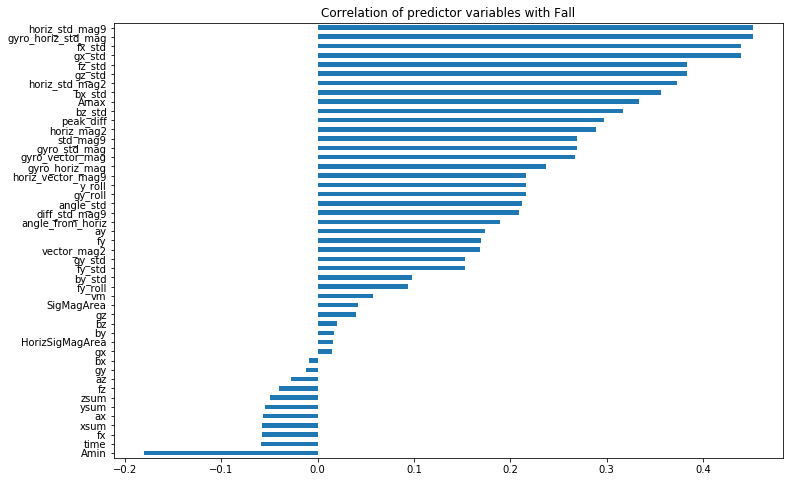

In [269]:
fall_windows = pd.concat(wList_f)
adl_windows = pd.concat(wList_a)
all_windows = pd.concat([fall_windows, adl_windows])

corr = all_windows.corr()['Fall']
corr_rank = corr.sort_values(ascending=False)

plt.subplots(figsize=(12,8))
cr = corr_rank.sort_values(ascending=True)
cr[:-1].plot(kind='barh')
plt.title('Correlation of predictor variables with Fall');

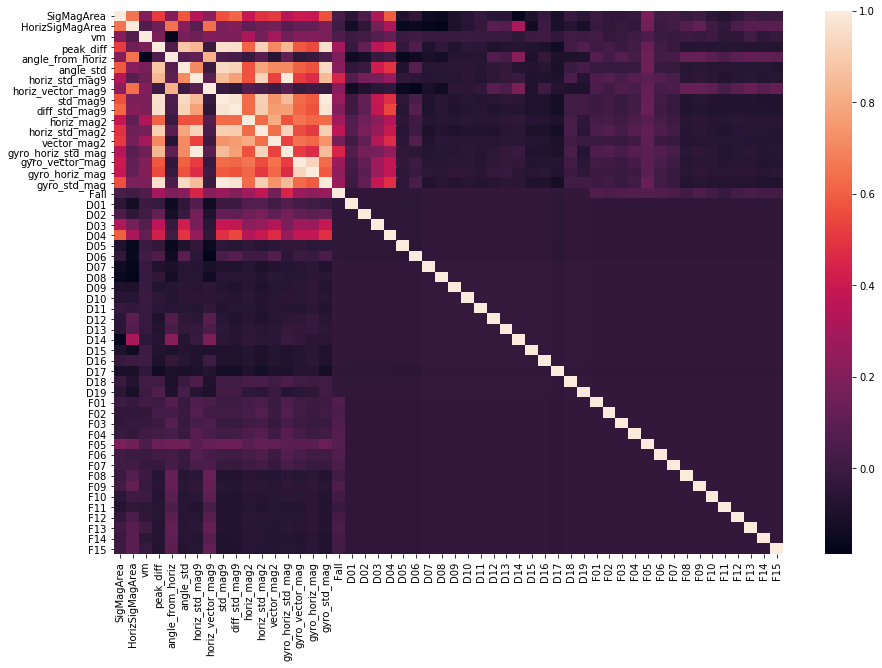

In [271]:
relevants = [ 'SigMagArea', 'HorizSigMagArea', 'vm','peak_diff', 'angle_from_horiz', 'angle_std', 'horiz_std_mag9',
       'horiz_vector_mag9', 'std_mag9', 'diff_std_mag9', 'horiz_mag2','horiz_std_mag2', 'vector_mag2', 'gyro_horiz_std_mag',
       'gyro_vector_mag', 'gyro_horiz_mag', 'gyro_std_mag', 'activity','subject', 'trial', 'Fall']
dum = pd.concat( [all_windows[relevants],pd.get_dummies(all_windows['activity'])], axis=1)
corrmat = dum.corr()
f, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(corrmat,annot=False);

# Falls

#### All numbered vertical lines are  128 points or 0.625 seconds apart. Therefore, the 0th window goes from 0-2, the 1st from 1-3, ... , up until the 21st.

### F01

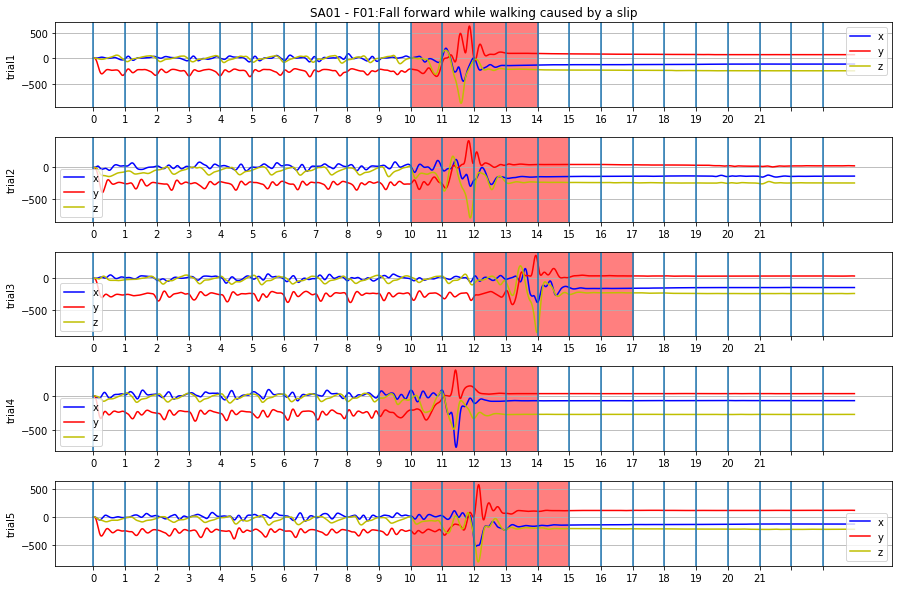

In [185]:
plot_trials(0,0,'f')

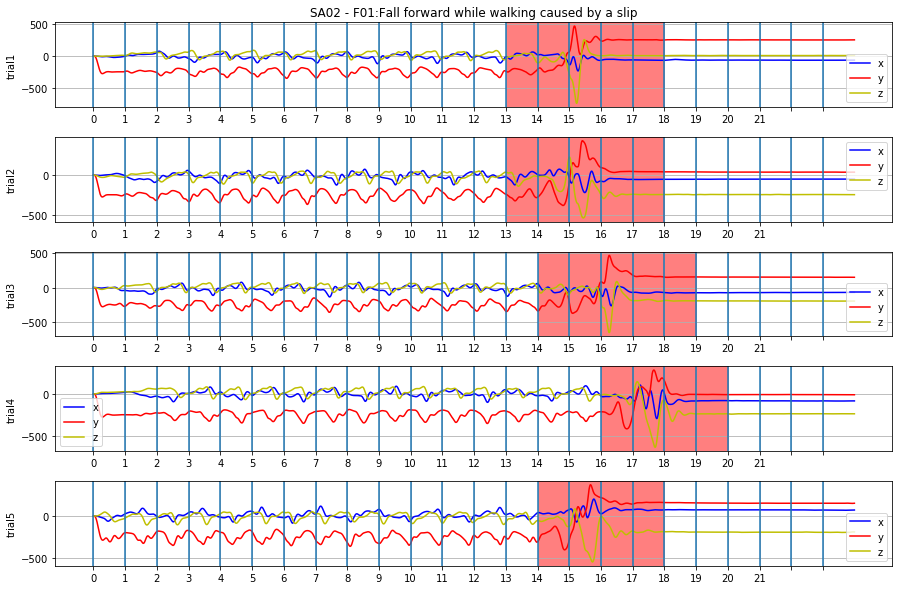

In [224]:
plot_trials(0,1,'f')

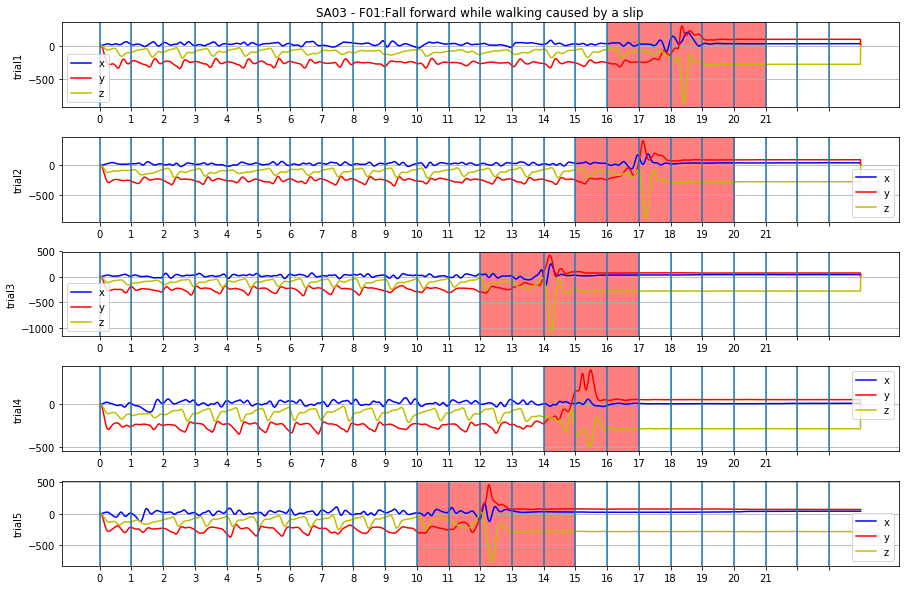

In [225]:
plot_trials(0,2,'f')

## F02

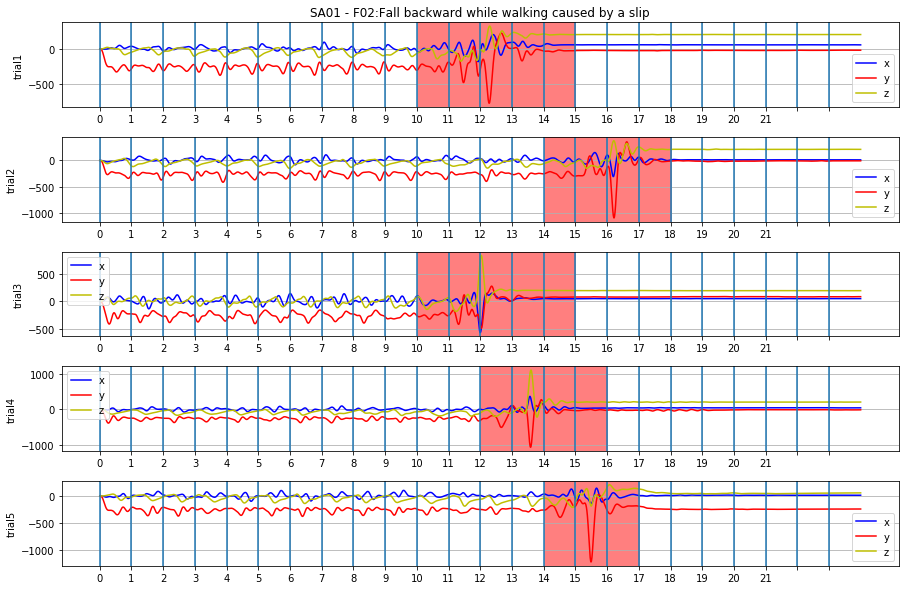

In [226]:
plot_trials(1,0,'f')

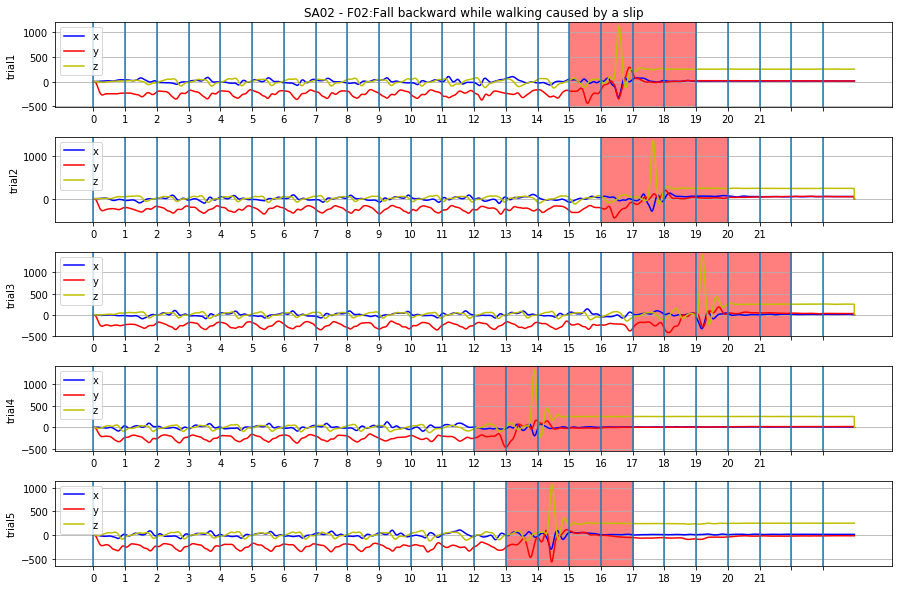

In [227]:
plot_trials(1,1,'f')

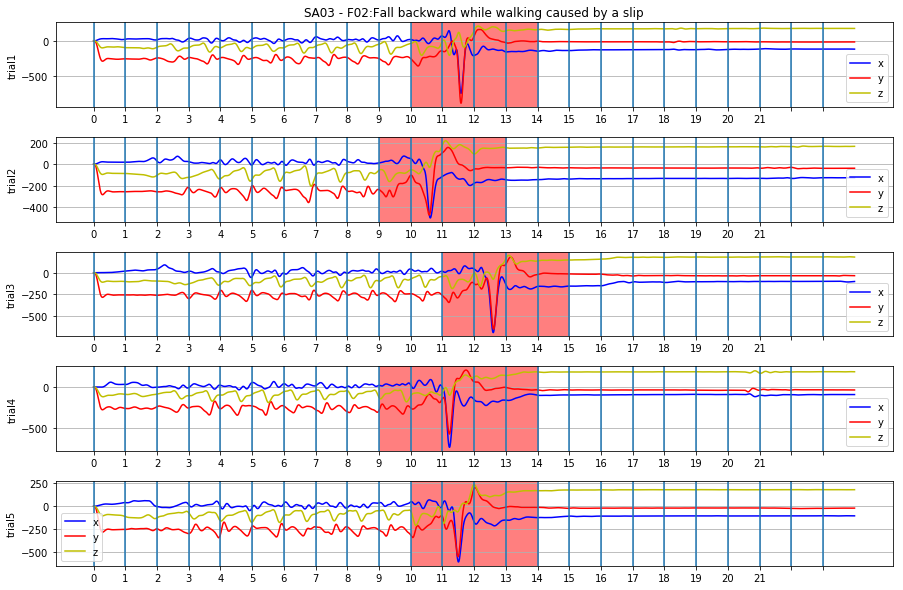

In [228]:
plot_trials(1,2,'f')

## F03

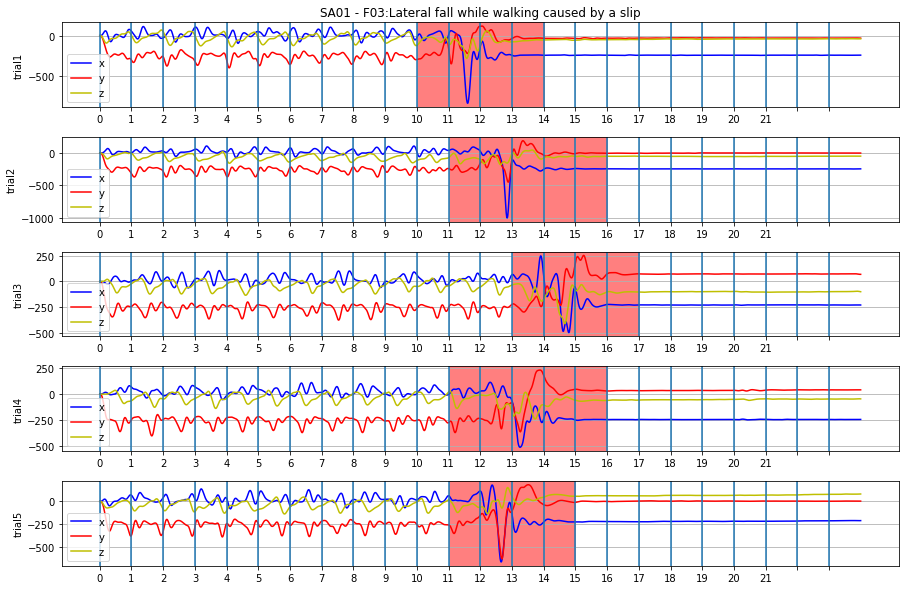

In [229]:
plot_trials(2, 0, 'f')

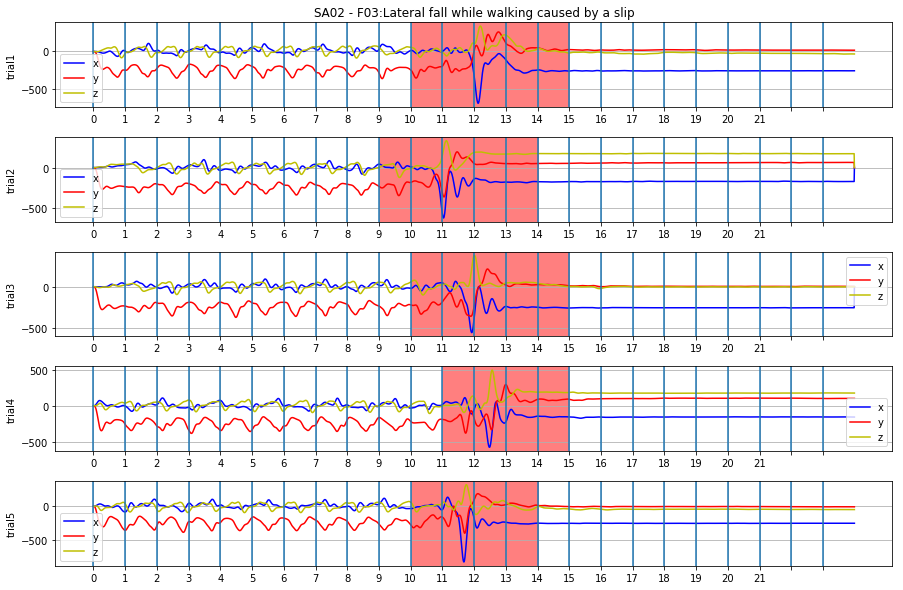

In [230]:
plot_trials(2, 1, 'f')

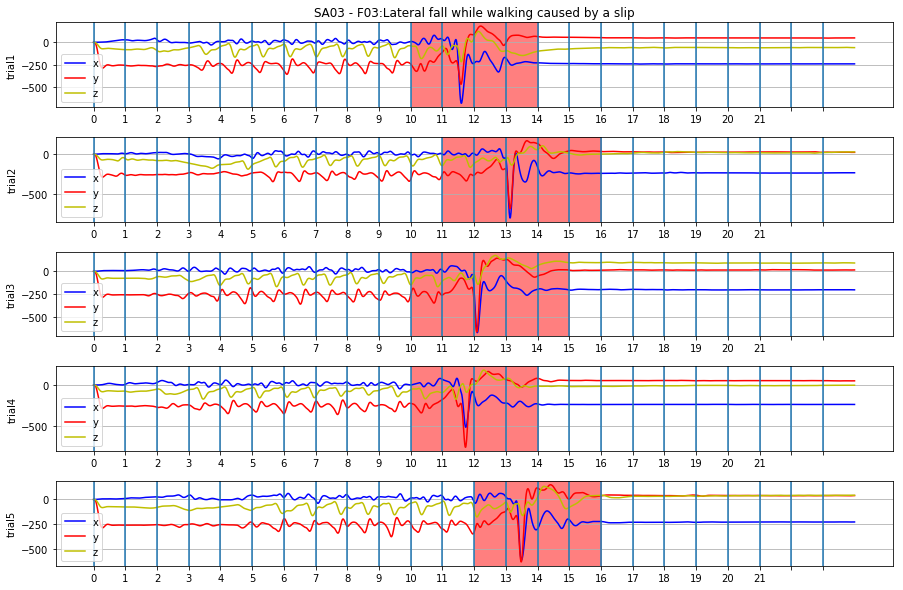

In [231]:
plot_trials(2, 2, 'f')

## F04

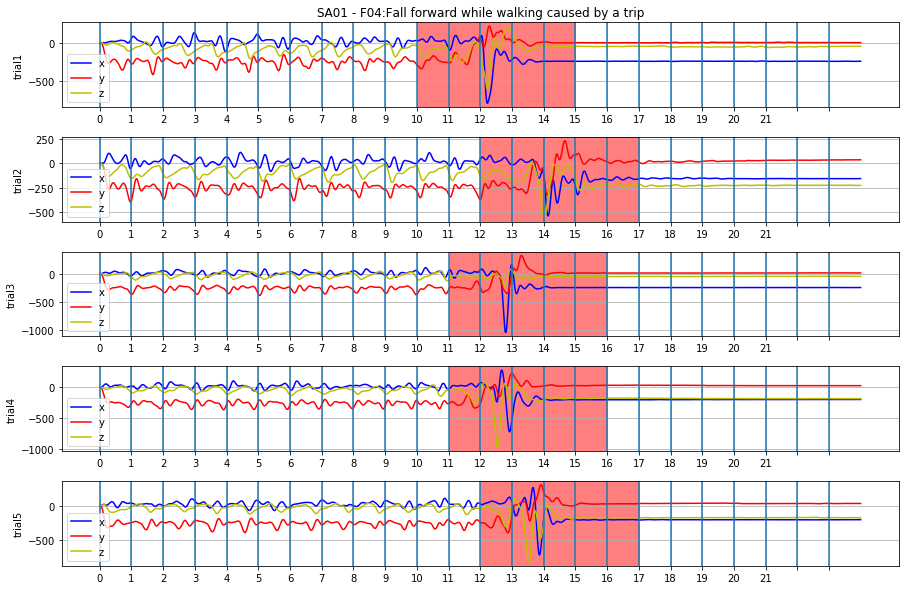

In [232]:
plot_trials(3, 0, 'f')

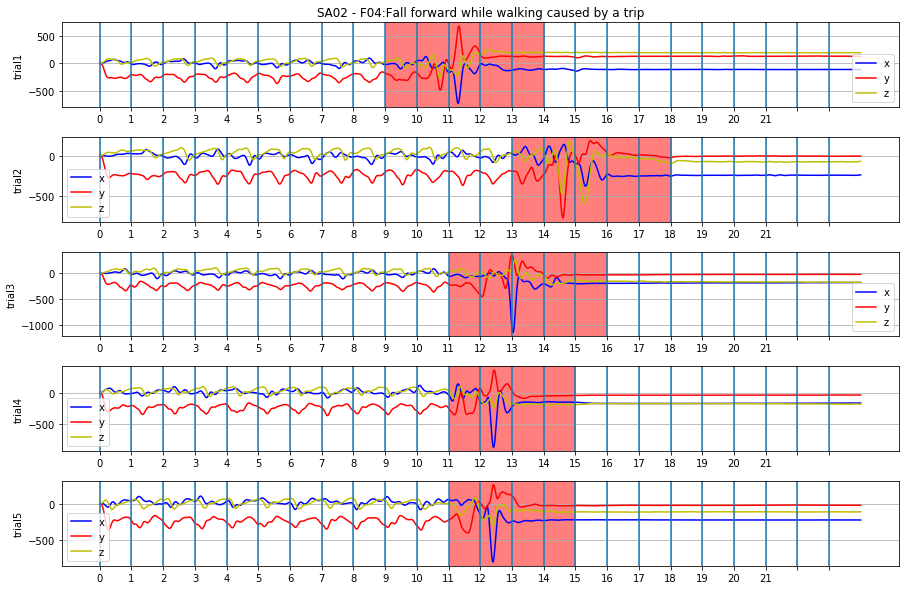

In [233]:
plot_trials(3, 1, 'f')

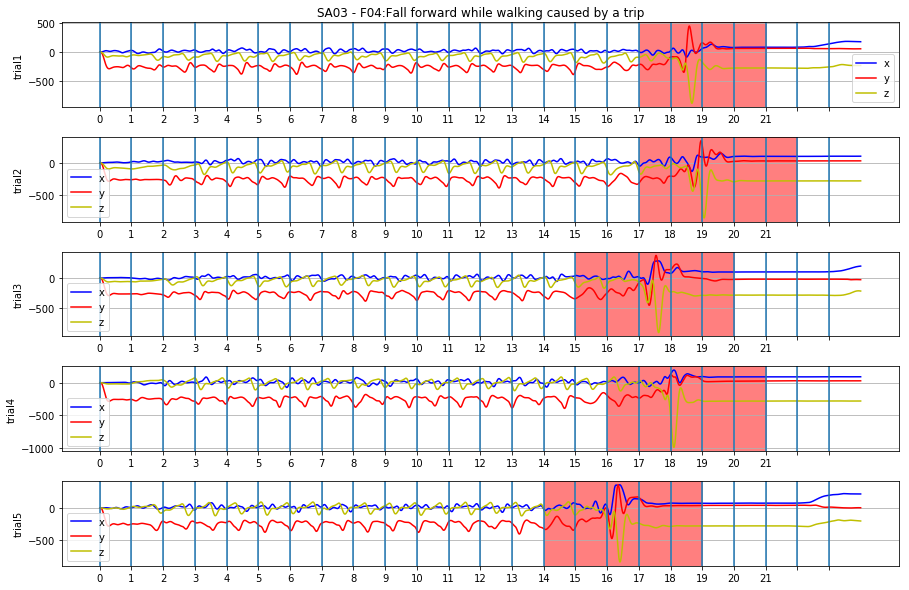

In [234]:
plot_trials(3, 2,'f')

## F05

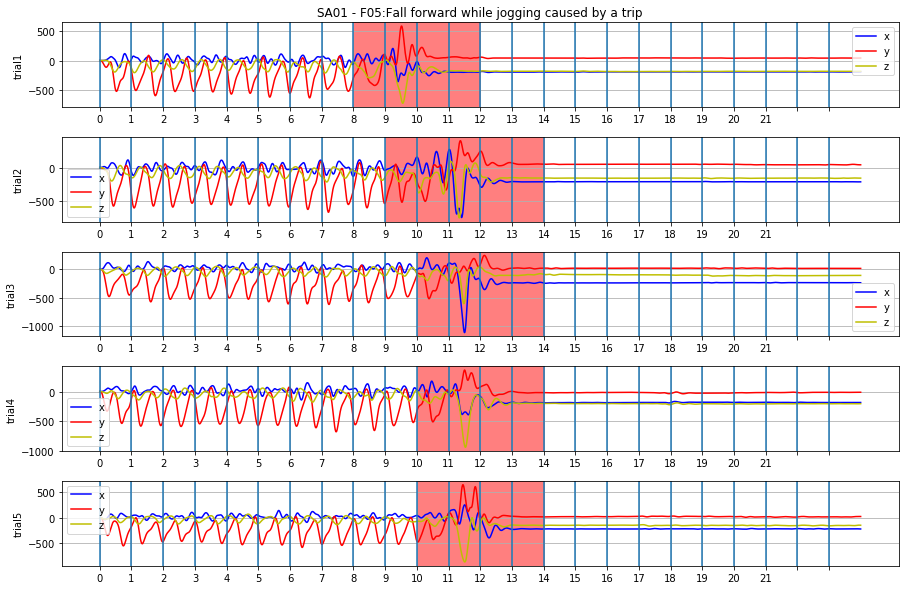

In [235]:
plot_trials(4, 0, 'f')

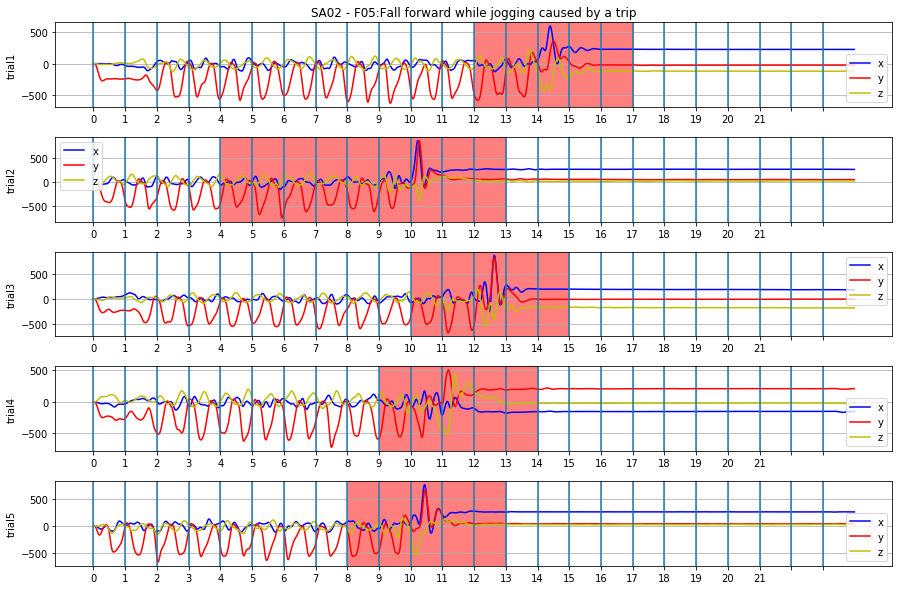

In [236]:
plot_trials(4, 1, 'f')

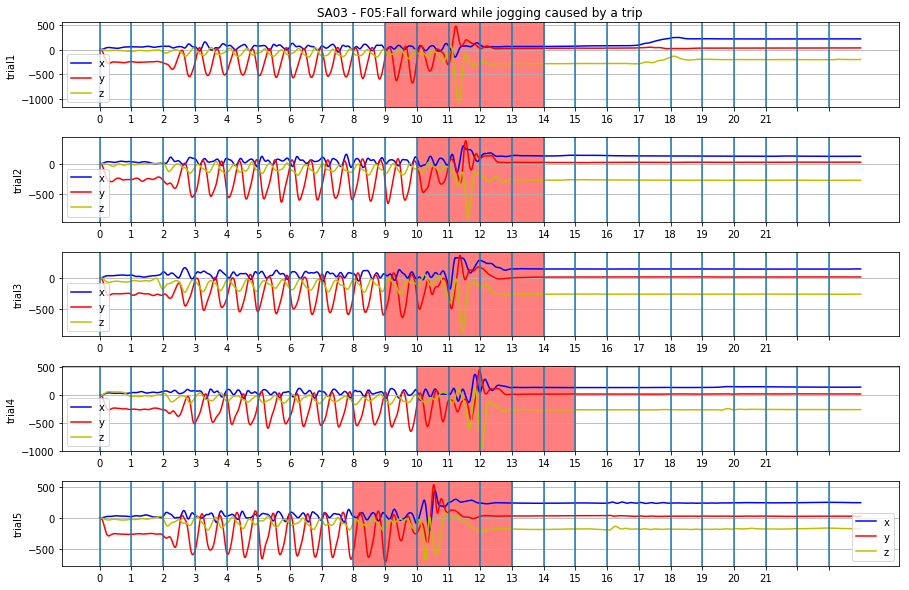

In [237]:
plot_trials(4, 2, 'f')

## F06

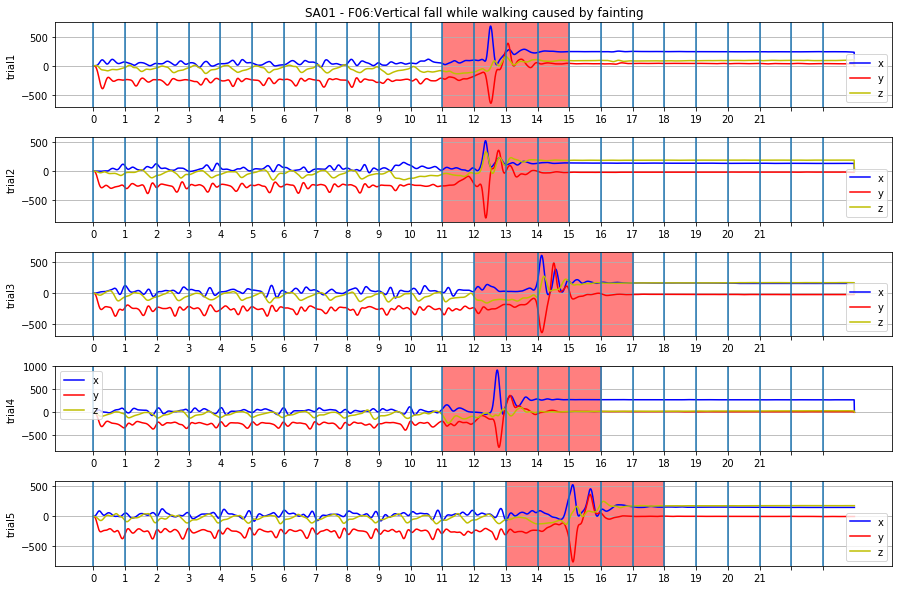

In [238]:
plot_trials(5, 0, 'f')

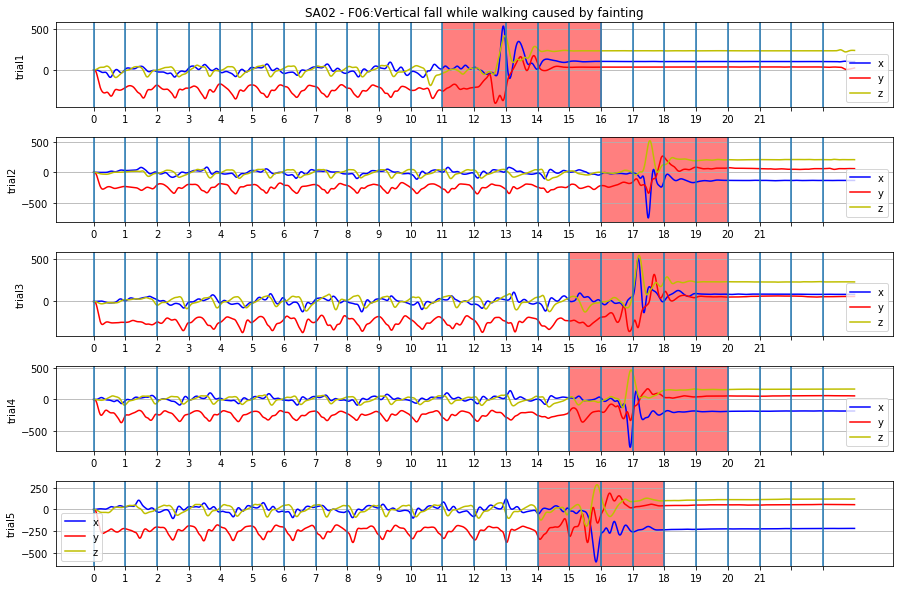

In [239]:
plot_trials(5, 1, 'f')

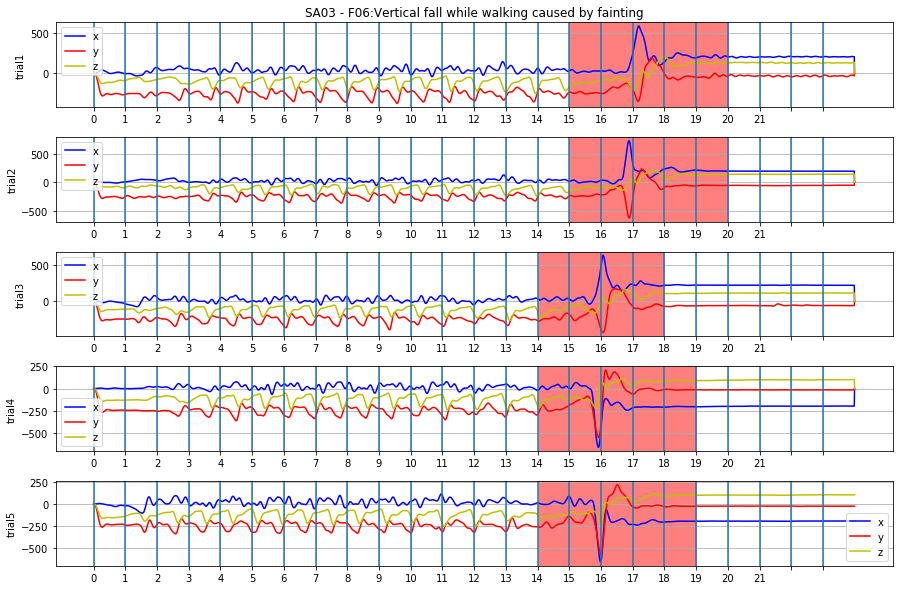

In [240]:
plot_trials(5, 2, 'f')

## F07

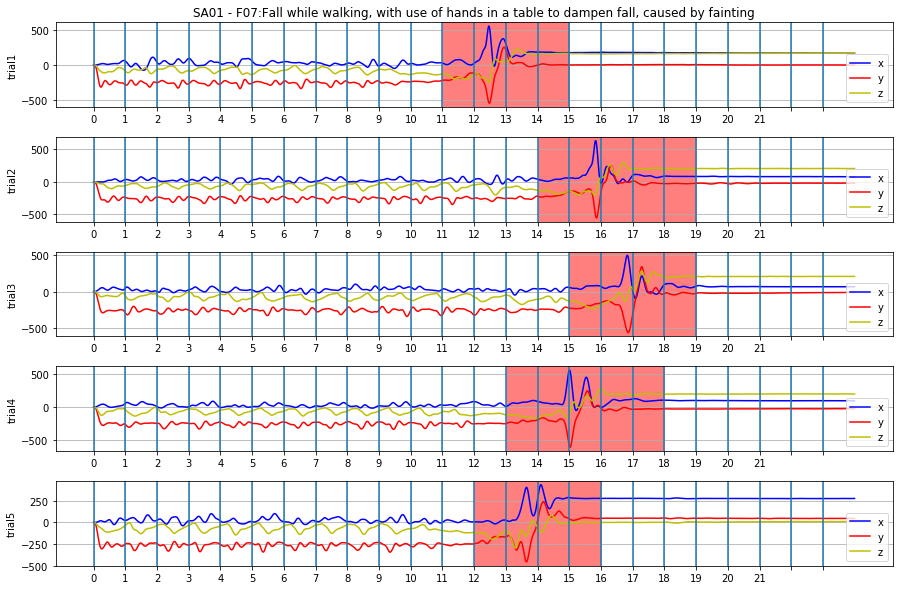

In [241]:
plot_trials(6, 0, 'f')

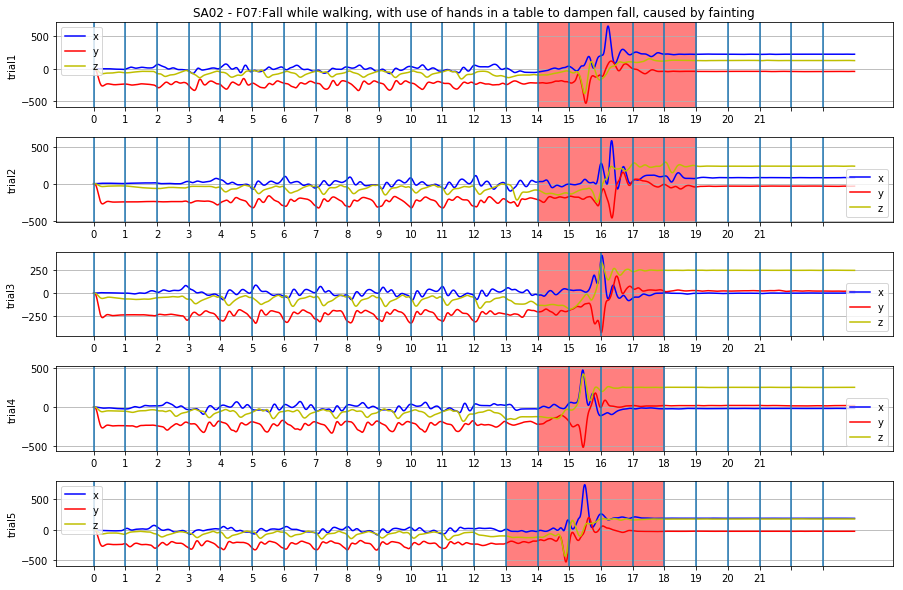

In [242]:
plot_trials(6, 1, 'f')

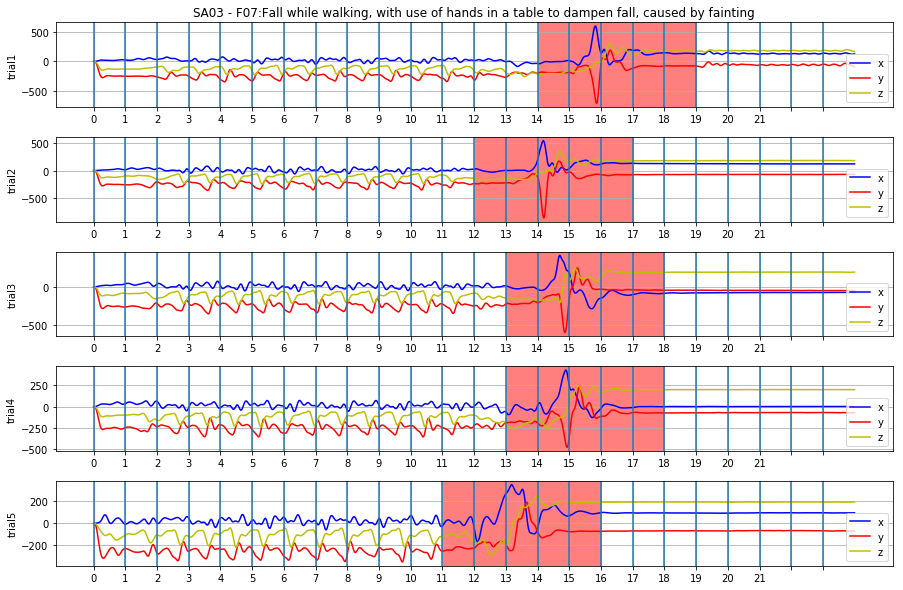

In [243]:
plot_trials(6, 2, 'f')

## F08

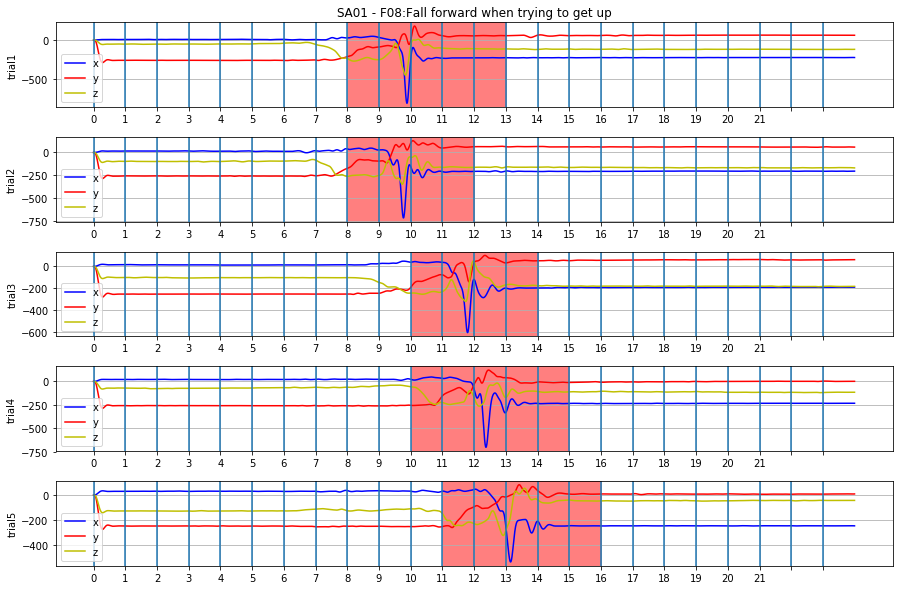

In [244]:
plot_trials(7, 0, 'f')

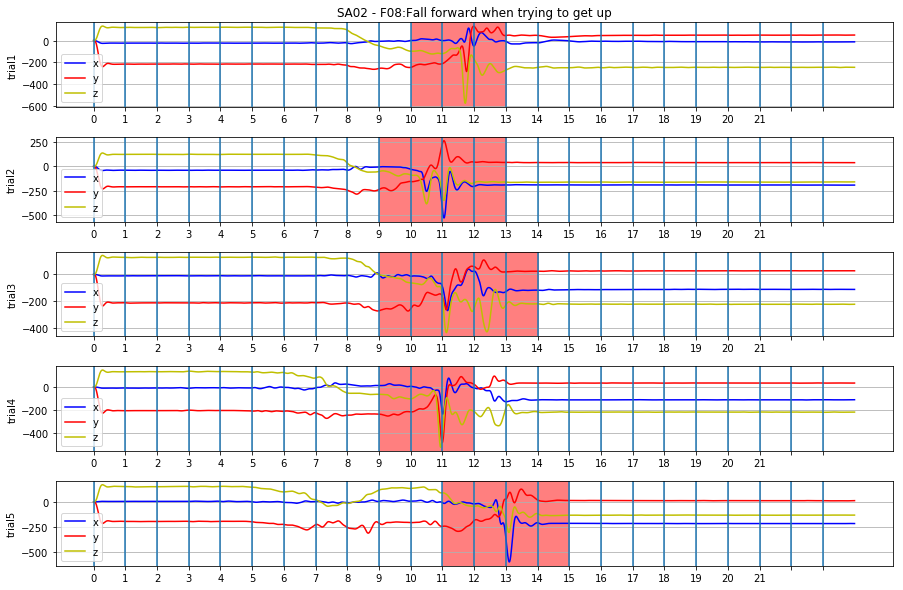

In [245]:
plot_trials(7, 1, 'f')

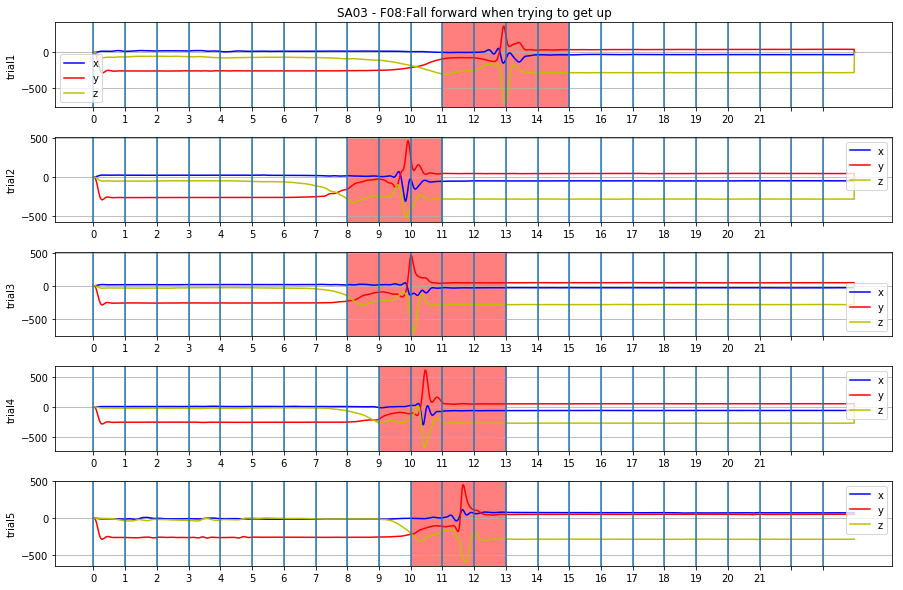

In [246]:
plot_trials(7, 2, 'f')

## F09

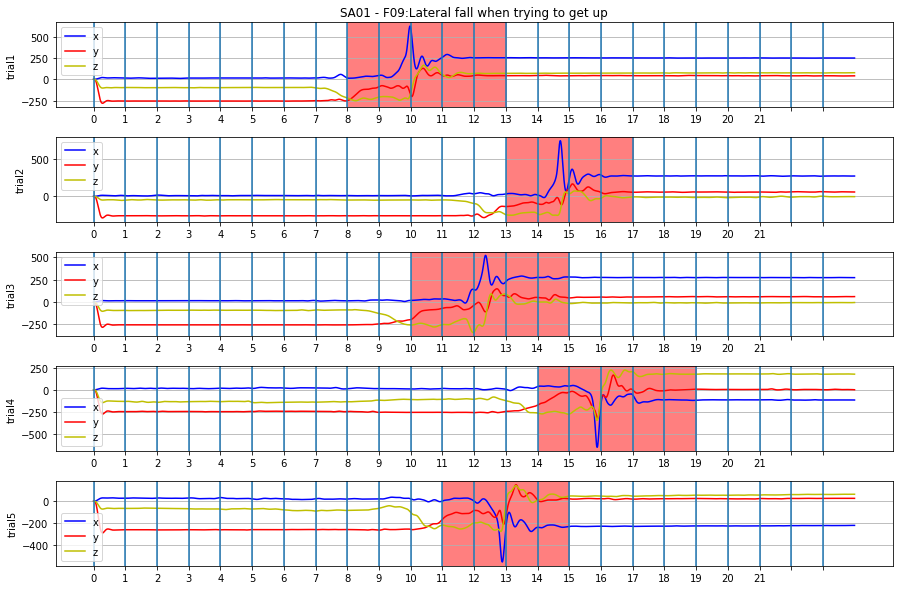

In [247]:
plot_trials(8, 0, 'f')

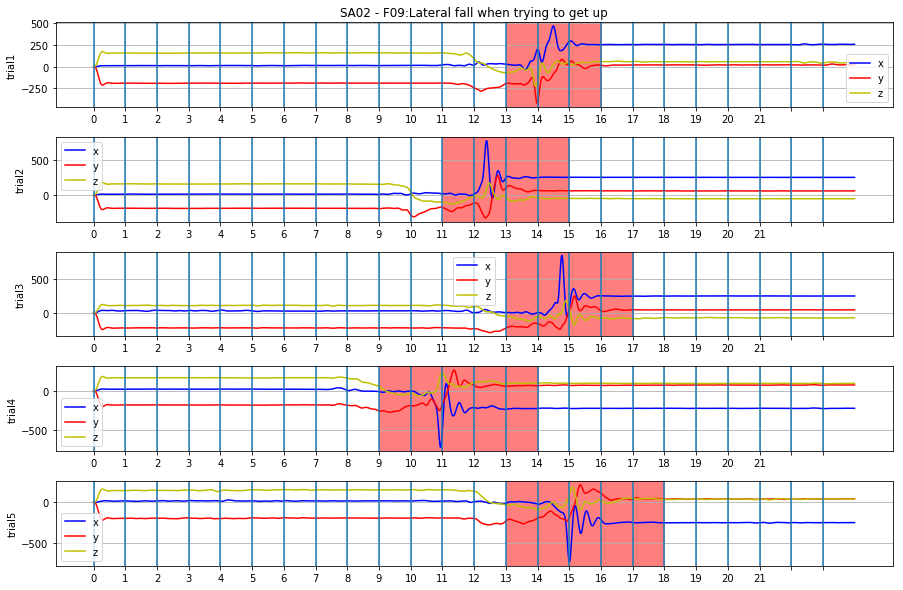

In [248]:
plot_trials(8, 1, 'f')

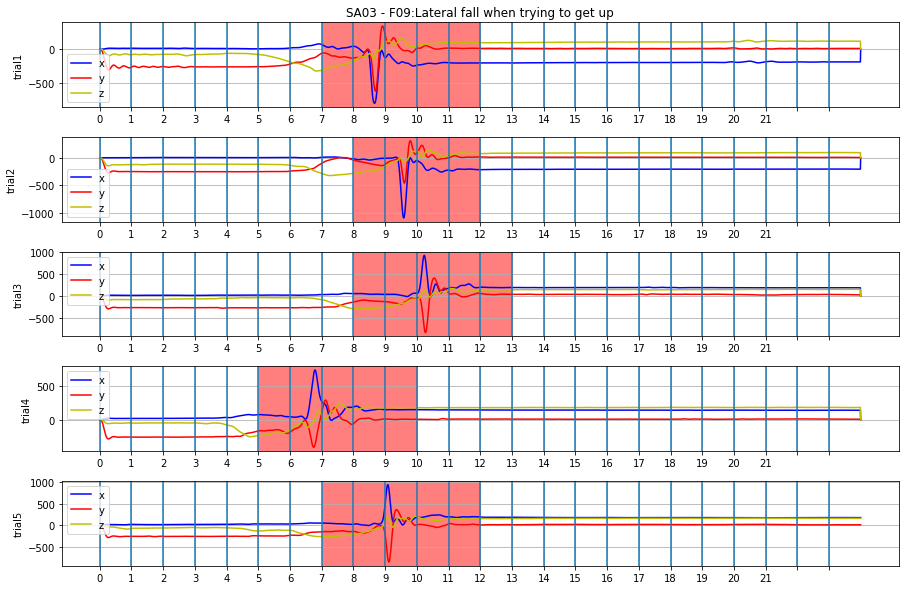

In [249]:
plot_trials(8, 2, 'f')

## F10

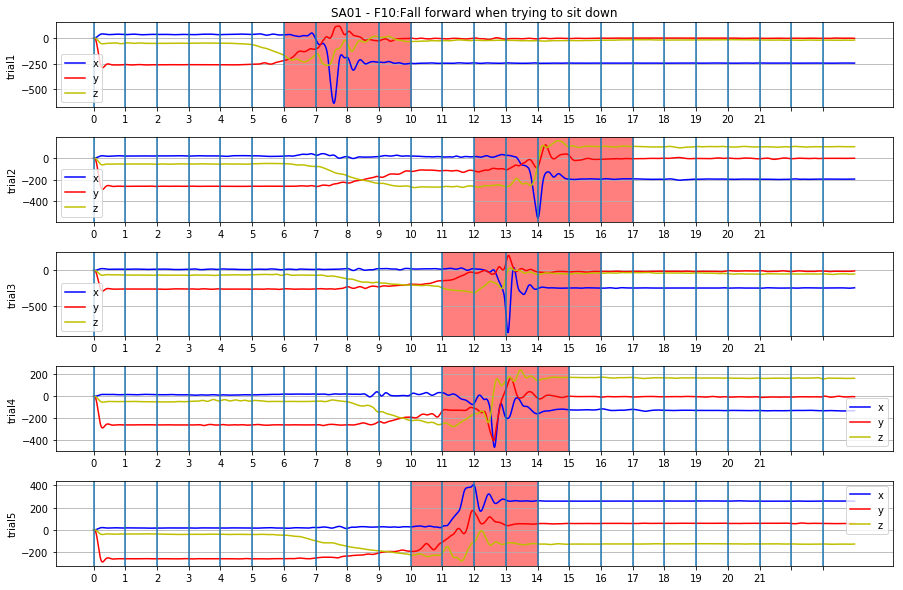

In [250]:
plot_trials(9, 0, 'f')

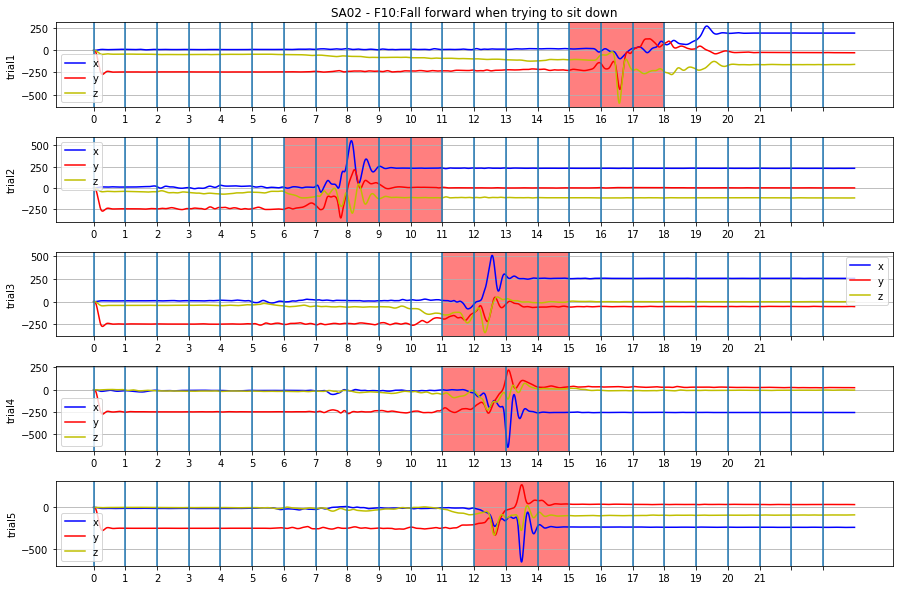

In [251]:
plot_trials(9, 1, 'f')

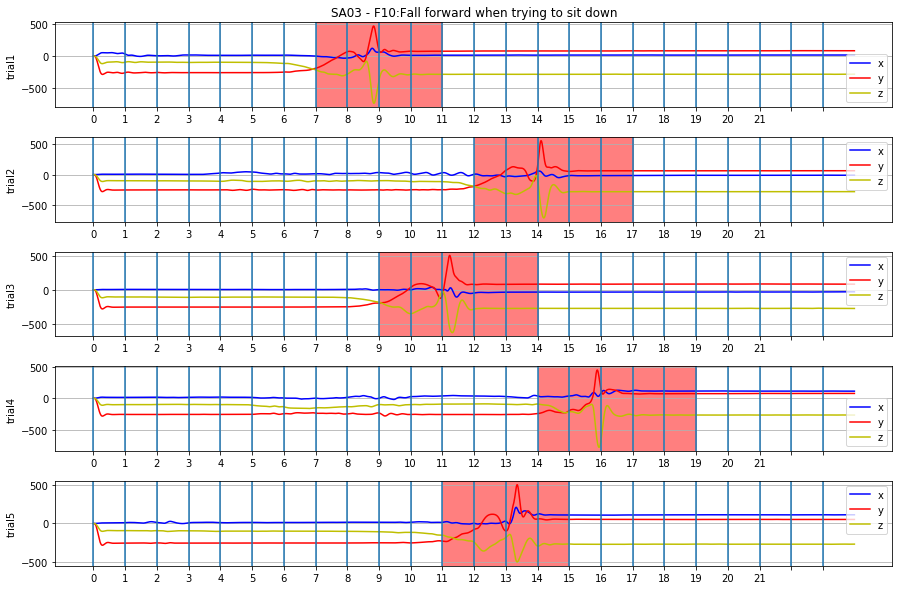

In [252]:
plot_trials(9, 2, 'f')

## F11

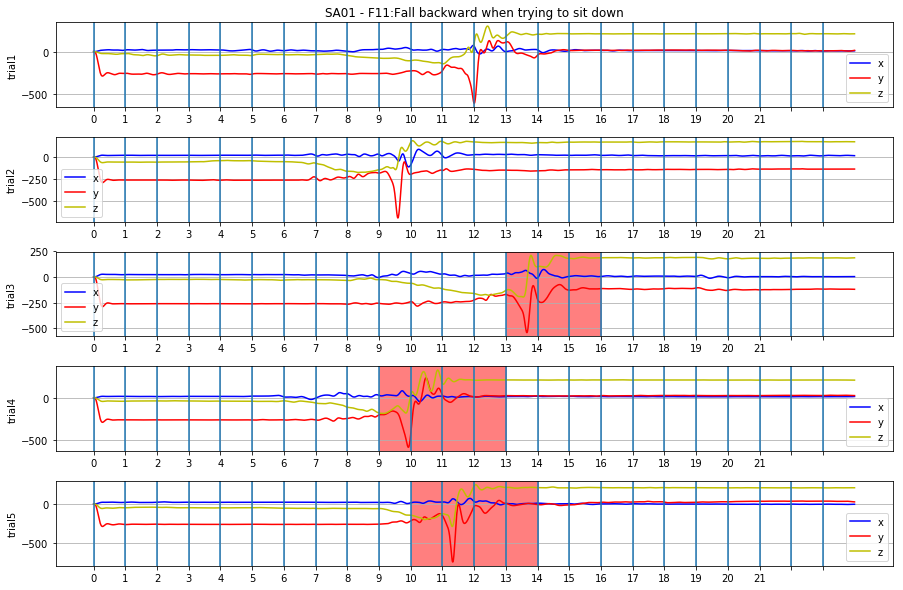

In [253]:
plot_trials(10, 0, 'f')

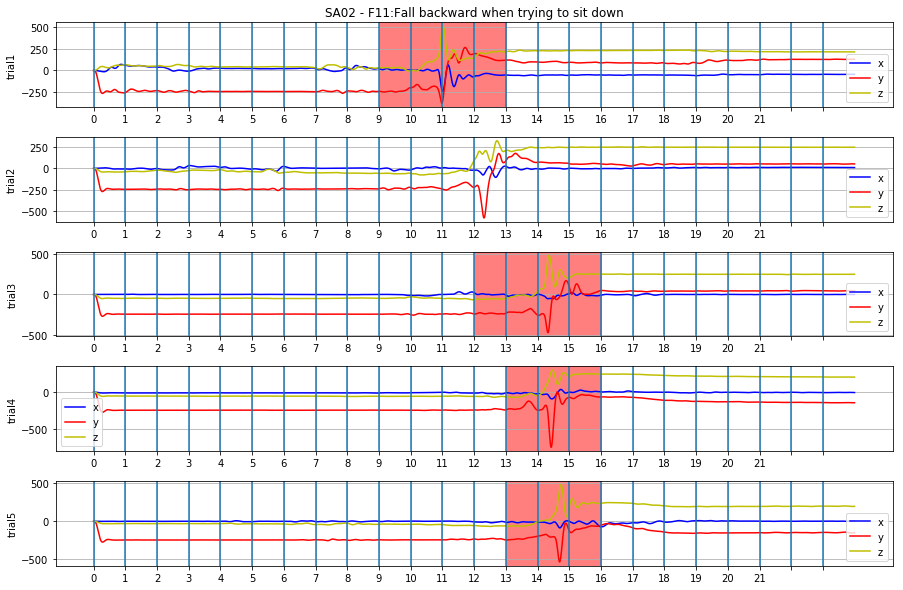

In [254]:
plot_trials(10, 1, 'f')

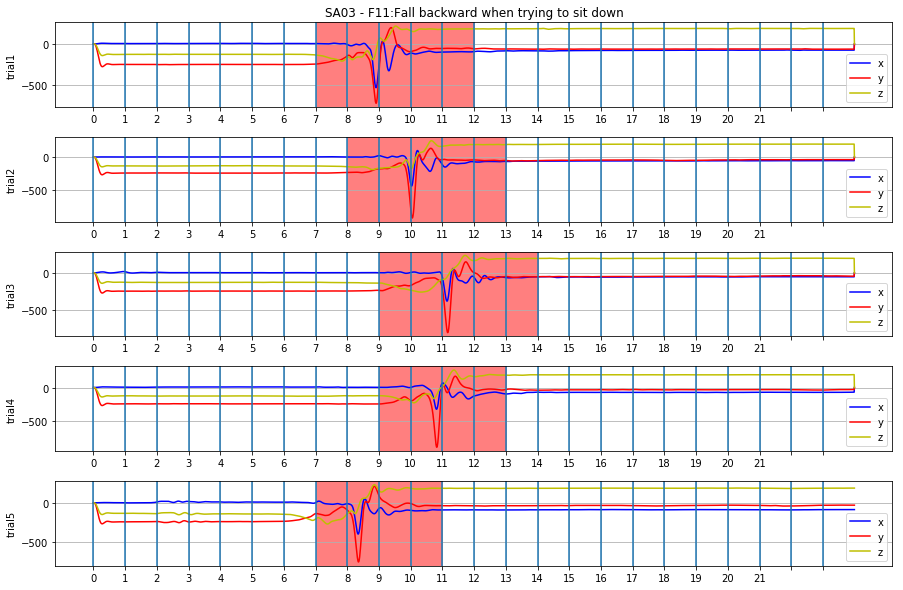

In [255]:
plot_trials(10, 2, 'f')

## F12

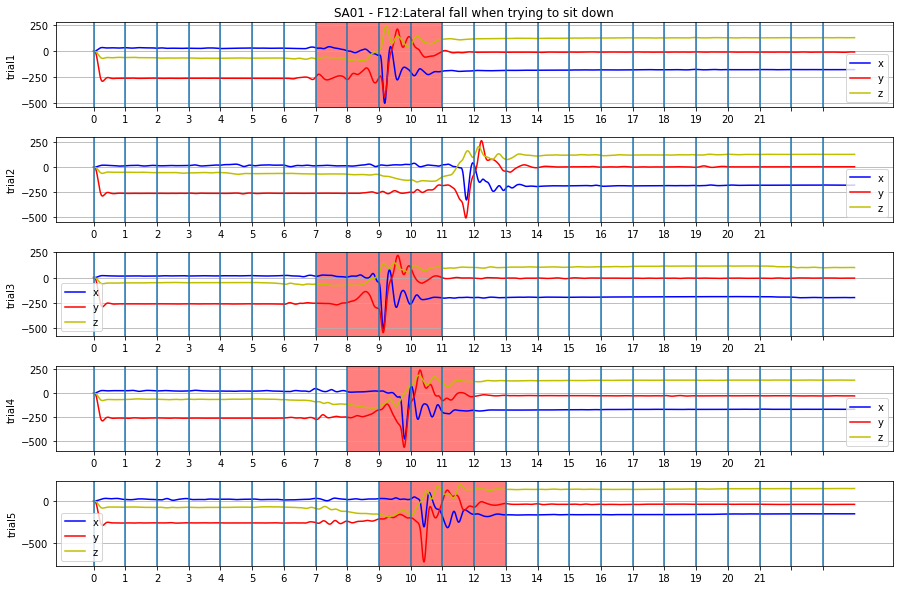

In [257]:
plot_trials(11, 0, 'f')

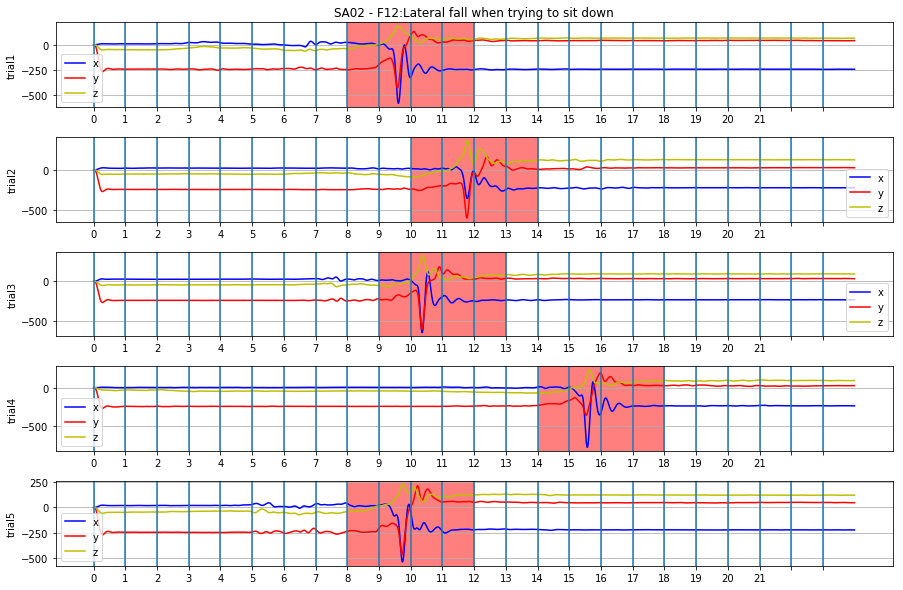

In [256]:
plot_trials(11, 1, 'f')

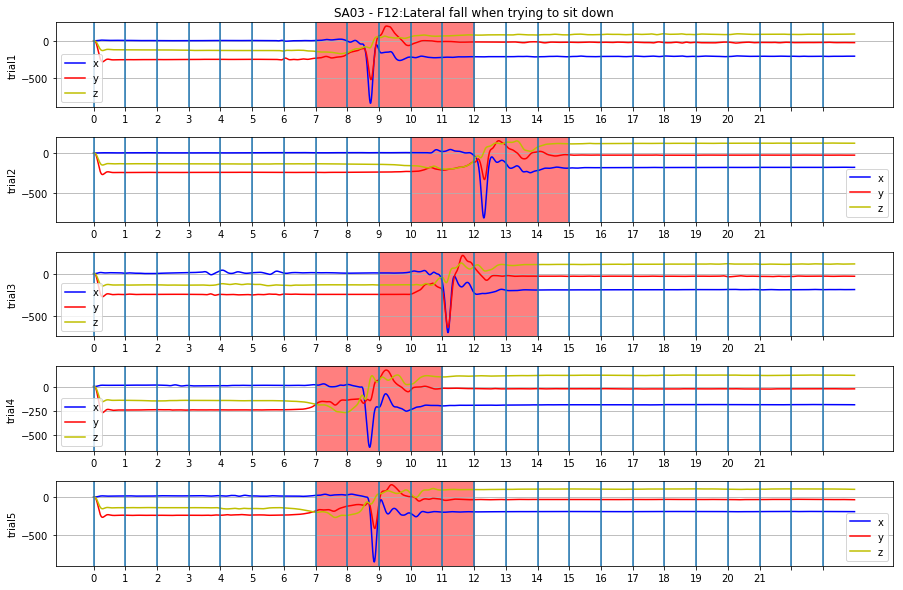

In [258]:
plot_trials(11, 2, 'f')

## F13

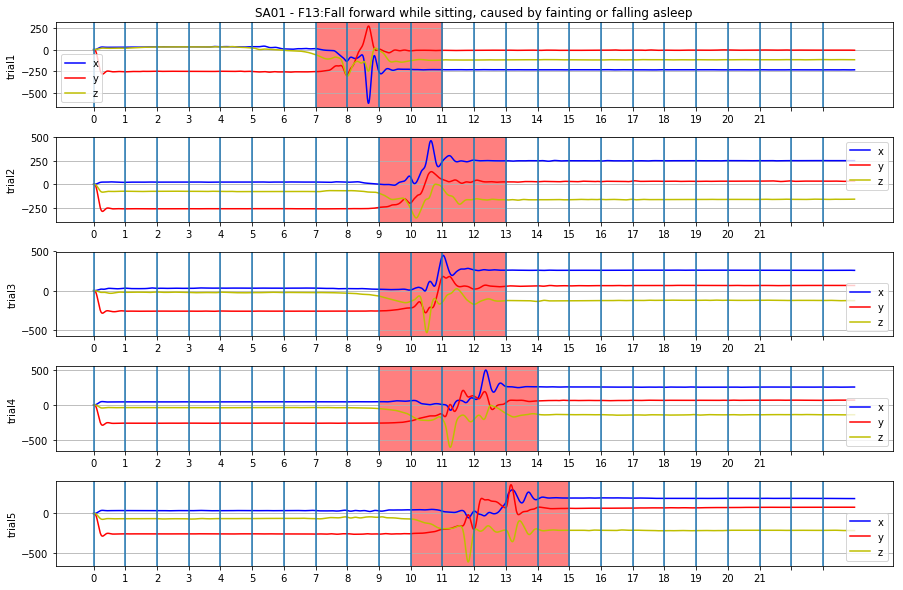

In [259]:
plot_trials(12, 0, 'f')

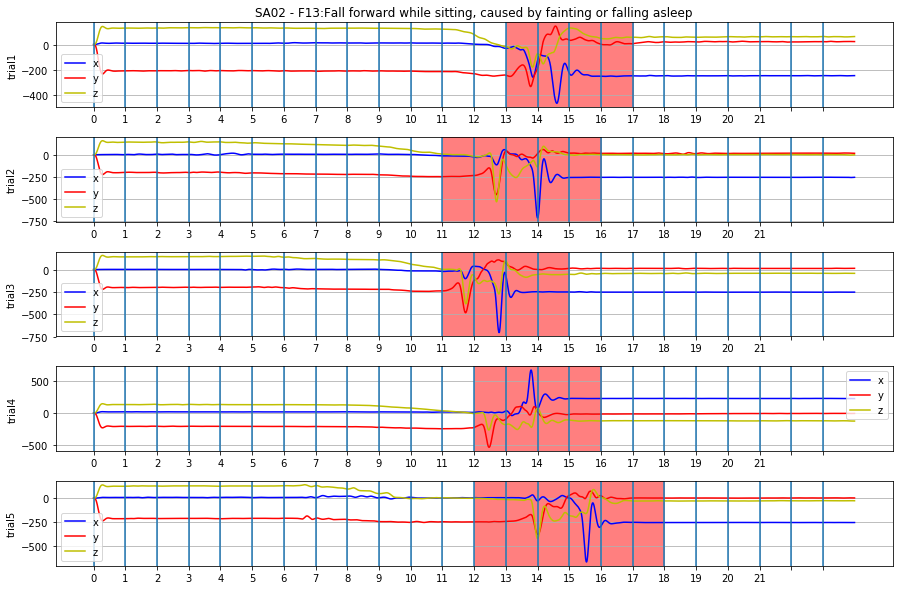

In [260]:
plot_trials(12, 1, 'f')

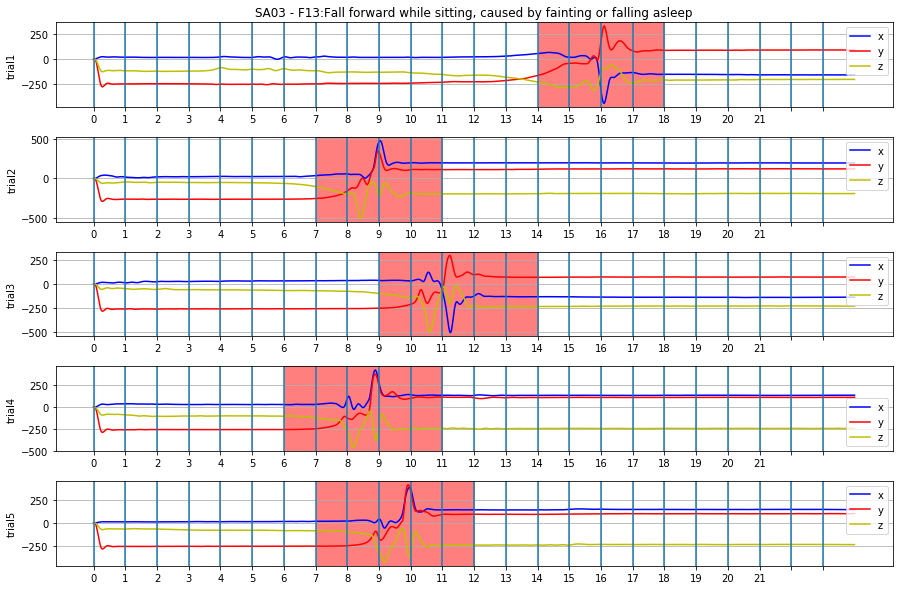

In [261]:
plot_trials(12, 2, 'f')

## F14

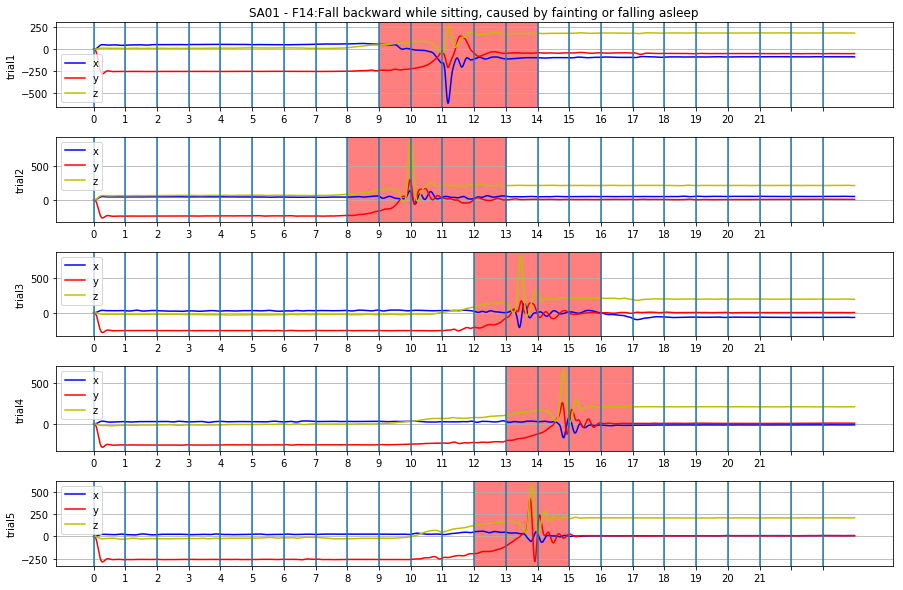

In [262]:
plot_trials(13, 0, 'f')

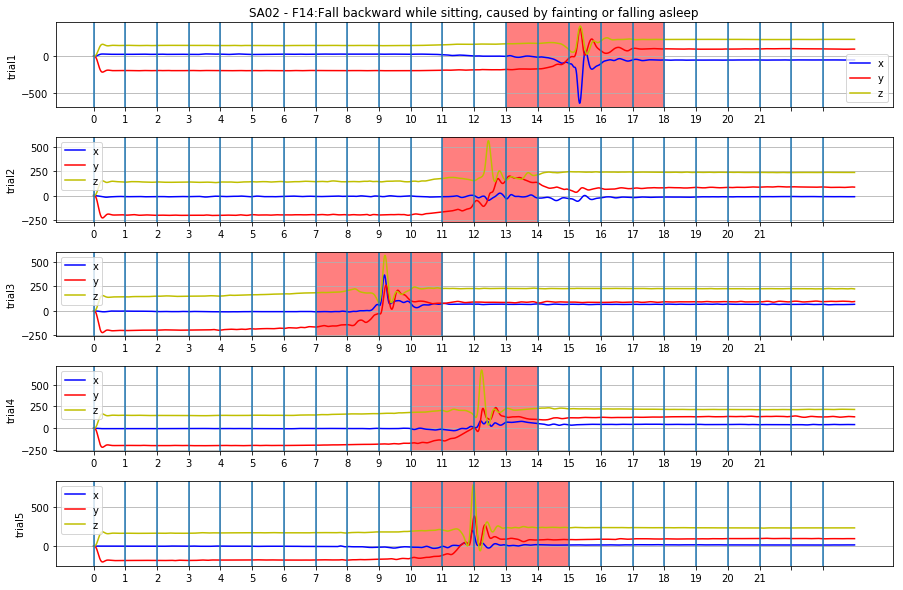

In [263]:
plot_trials(13, 1, 'f')

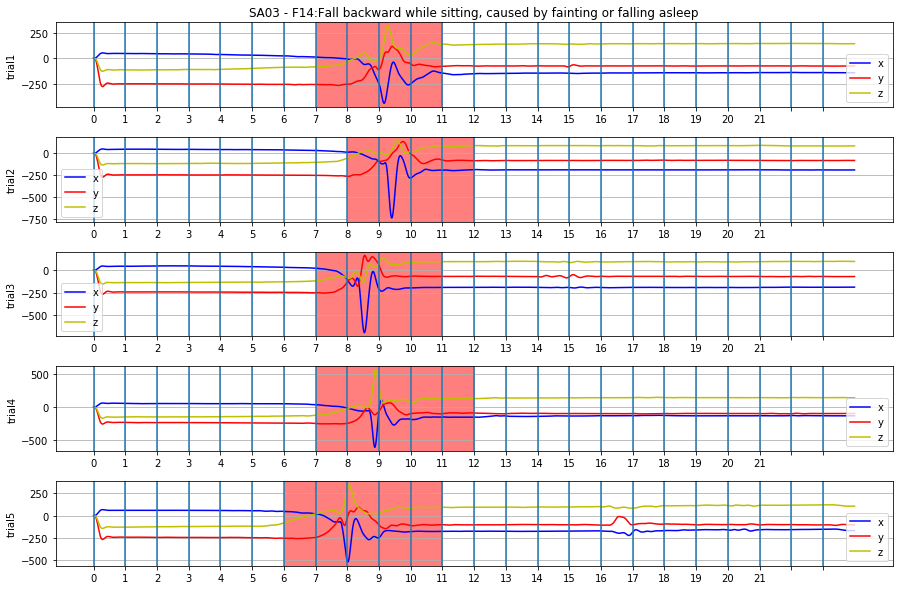

In [264]:
plot_trials(13, 2, 'f')

## F15

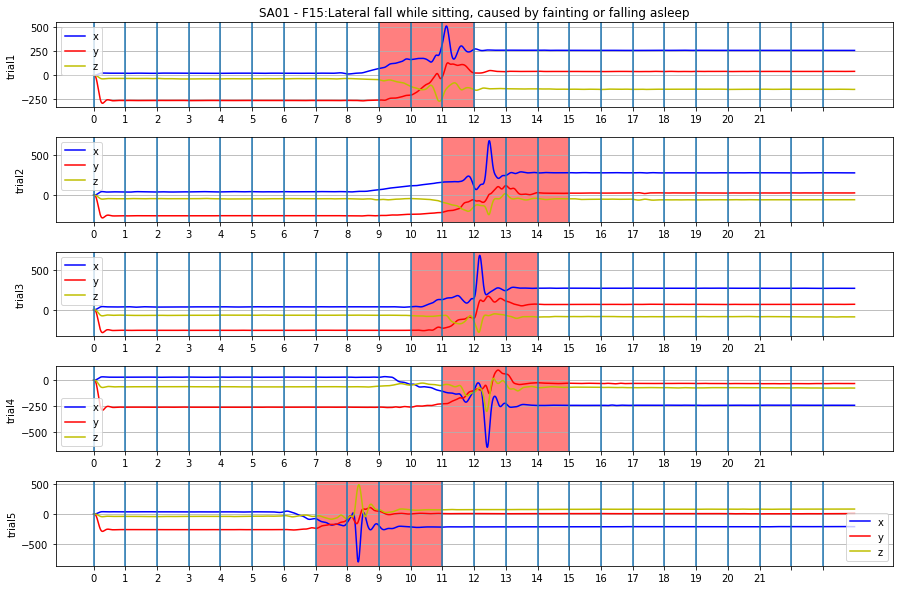

In [265]:
plot_trials(14, 0, 'f')

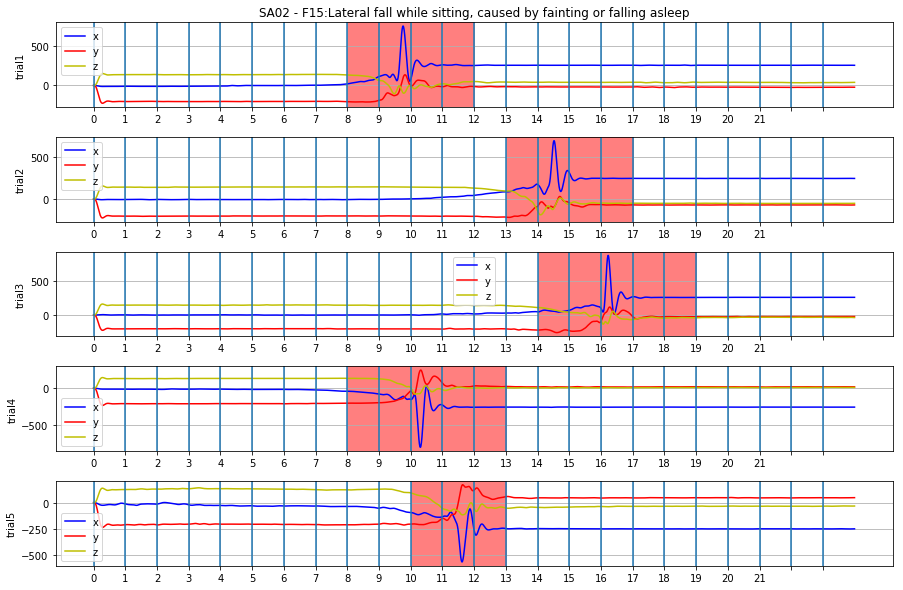

In [266]:
plot_trials(14, 1, 'f')

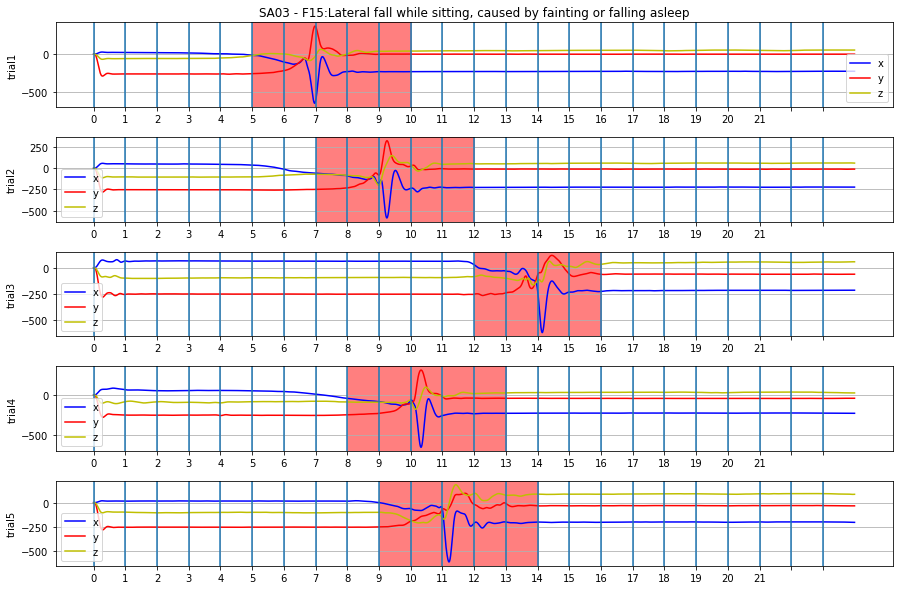

In [267]:
plot_trials(14, 2, 'f')

In [163]:
fall_windows['Fall'].sum()/len(fall_windows) # % of fall windows marked as fall

0.07373737373737374

In [53]:
print('*ADL Horizontal Standard Deviation Magnitude max:', 
      adl_df.groupby(['activity', 'subject'])['horiz_std_mag9'].max().max().round(3))
print('*Fall Horizontal Standard Deviation Magnitude min max:', 
      fall_df.groupby(['activity', 'subject'])['horiz_std_mag9'].max().min().round(3), '\n')
print('*ADL Horizontal Vector Magnitude max:', 
      adl_df.groupby(['activity', 'subject'])['horiz_vector_mag9'].max().max().round(3))
print('*Fall Horizontal Vector Magnitude min max:', 
      fall_df.groupby(['activity', 'subject'])['horiz_vector_mag9'].max().min().round(3), '\n')
print('*ADL horiz_std_mag2 max:', 
      adl_windows.groupby(['activity', 'subject'])['horiz_std_mag2'].max().max().round(3))
print('*Fall horiz_std_mag2 min max:', 
      fall_windows.groupby(['activity', 'subject'])['horiz_std_mag2'].max().min().round(3), '\n')
print('*ADL gyro_horiz_std_mag max:', 
      adl_windows.groupby(['activity', 'subject'])['gyro_horiz_std_mag'].max().max().round(3))
print('*Fall gyro_horiz_std_mag min max:', 
      fall_windows.groupby(['activity', 'subject'])['gyro_horiz_std_mag'].max().min().round(3), '\n')
print('*ADL vm max:', 
      adl_windows.groupby(['activity', 'subject'])['vm'].max().max().round(3))
print('*Fall vm min max:', 
      fall_windows.groupby(['activity', 'subject'])['vm'].max().min().round(3))

*ADL Horizontal Standard Deviation Magnitude max: 171.28
*Fall Horizontal Standard Deviation Magnitude min max: 154.068

*ADL Horizontal Vector Magnitude max: 497.831
*Fall Horizontal Vector Magnitude min max: 327.686

*ADL horiz_std_mag2 max: 22.801
*Fall horiz_std_mag2 min max: 8.515

*ADL gyro_horiz_std_mag max: 171.28
*Fall gyro_horiz_std_mag min max: 154.068

*ADL vm max: 1067.191
*Fall vm min max: 677.804

*ADL HorizSigMagArea max: 301.425
*Fall HorizSigMagArea min max: 161.236



In [38]:
vals = ["horiz_vector_mag9", 'horiz_std_mag9', 'vm',  'angle_from_horiz', 
        'angle_std', 'std_mag9', 'peak_diff', 'gyro_horiz_std_mag', 'horiz_std_mag2', 'gyro_std_mag']

pivot1 = pd.pivot_table(all_windows, index= 'activity', values= vals, aggfunc= [min, max, np.mean])
pivot2 = pd.pivot_table(all_windows, index= 'Fall', values= vals, aggfunc= [min, max, np.mean])

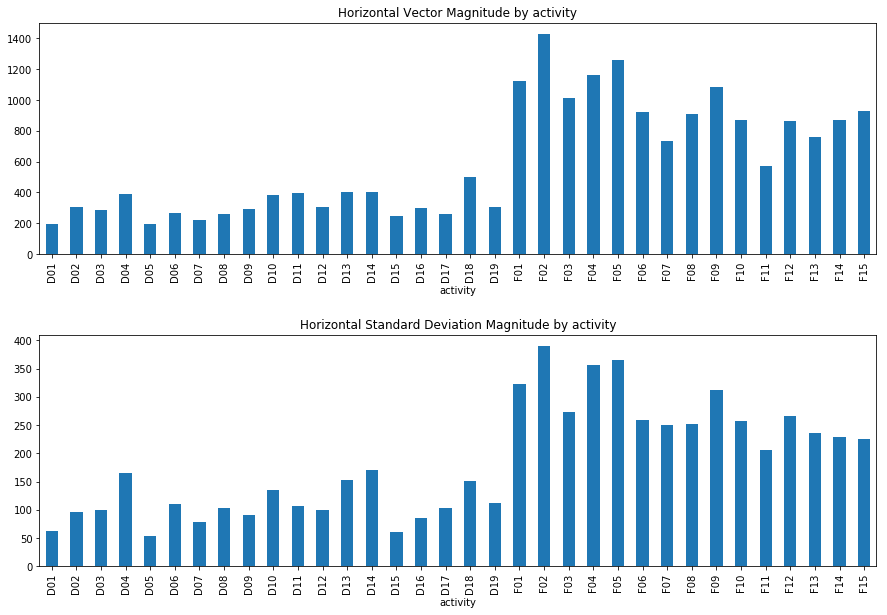

In [22]:
plt.figure(figsize=(15,10))
plt.subplot(2, 1, 1)
x = pivot1.loc[:, ('max', 'horiz_vector_mag9')]
x.plot(kind='bar')
plt.title('Horizontal Vector Magnitude by activity')

plt.subplot(2, 1, 2)
x = pivot1.loc[:, ('max', 'horiz_std_mag9')]
x.plot(kind='bar');
plt.title('Horizontal Standard Deviation Magnitude by activity');
plt.subplots_adjust(hspace=0.35);

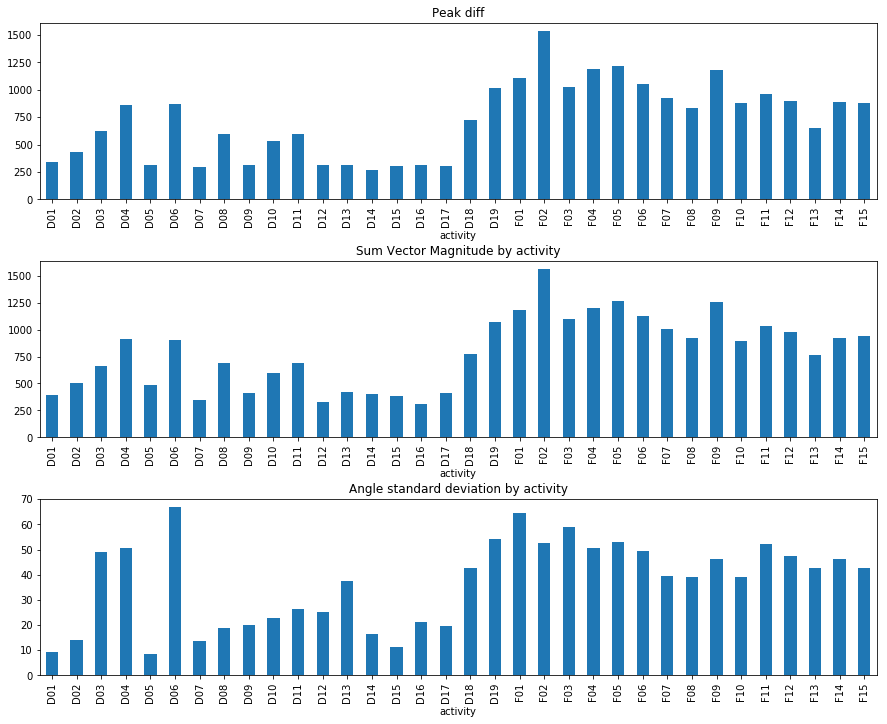

In [23]:
plt.figure(figsize=(15,12))
plt.subplot(3, 1, 1)
x = pivot1.loc[:, ('max', 'peak_diff')]
x.plot(kind='bar')
plt.title('Peak diff')

plt.subplot(3, 1, 2)
x = pivot1.loc[:, ('max', 'vm')]
x.plot(kind='bar')
plt.title('Sum Vector Magnitude by activity')

plt.subplot(3, 1, 3)
x = pivot1.loc[:, ('max', 'angle_std')]
x.plot(kind='bar');
plt.title('Angle standard deviation by activity')
plt.subplots_adjust(hspace=0.35);

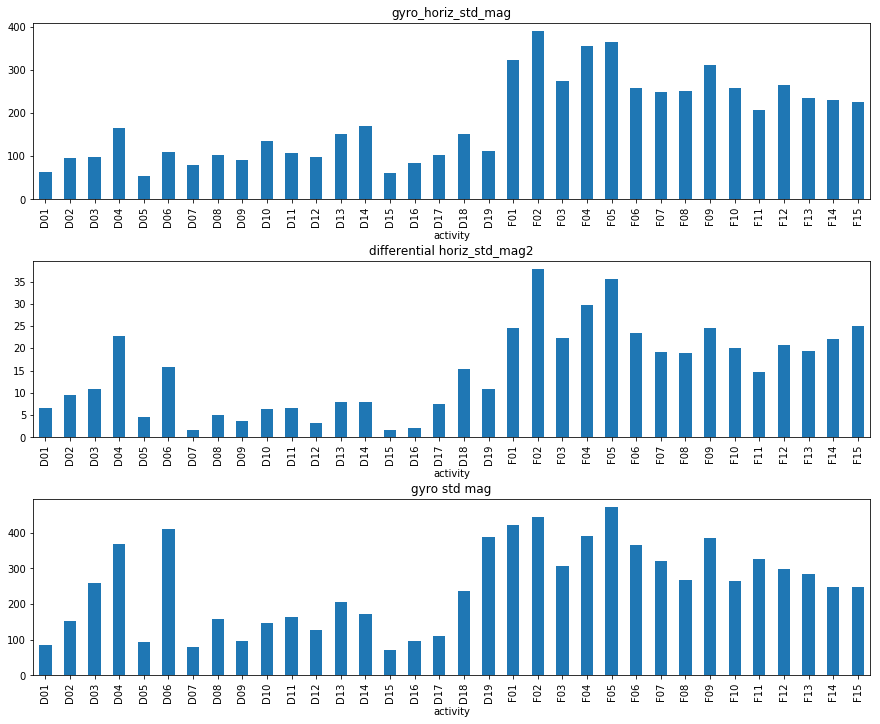

In [24]:
plt.figure(figsize=(15,12))
plt.subplot(3, 1, 1)
x = pivot1.loc[:, ('max', 'gyro_horiz_std_mag')]
x.plot(kind='bar')
plt.title('gyro_horiz_std_mag')

plt.subplot(3, 1, 2)
x = pivot1.loc[:, ('max', 'horiz_std_mag2')]
x.plot(kind='bar')
plt.title('differential horiz_std_mag2')

plt.subplot(3, 1, 3)
x = pivot1.loc[:, ('max', 'gyro_std_mag')]
x.plot(kind='bar');
plt.title('gyro std mag')
plt.subplots_adjust(hspace=0.35);

In [127]:
vals = ['Amin', 'horiz_vector_mag9', 'horiz_std_mag9', 'vm',  'angle_from_horiz', 
        'angle_std', 'std_mag9', 'peak_diff', 'gyro_horiz_std_mag', 'horiz_std_mag2', 'gyro_std_mag', 'HorizSigMagArea']

pivot3 = pd.pivot_table(all_windows, index= ['activity', 'subject', 'trial'], values= vals, aggfunc= [max])
pivot3.head()

max                                             \
                              Amin HorizSigMagArea angle_from_horiz angle_std   
activity subject trial                                                          
D01      SA01    R01    232.316113       89.000000        29.299727  7.323076   
         SA02    R01    229.020464       69.665943        24.098543  5.495428   
         SA03    R01    272.822990      129.982821        40.175150  9.379132   
D02      SA01    R01    195.752368      128.595238        40.474339  9.450424   
         SA02    R01    234.769423       85.419223        30.868354  7.462618   

                                                                       \
                       gyro_horiz_std_mag gyro_std_mag horiz_std_mag2   
activity subject trial                                                  
D01      SA01    R01            62.999091    83.905330       6.004849   
         SA02    R01            62.143990    82.360203       4.821328   
         SA03    R01            62.148473    73.237558       6.616273   
D02      SA01    R01            89.147400   125.787383       9.571425   
         SA02    R01            69.744846   114.193489       6.177487   

                                                                     \
                       horiz_std_mag9 horiz_vector_mag9   peak_diff   
activity subject trial                                                
D01      SA01    R01        62.999091        144.188415  342.738010   
         SA02    R01        62.143990        120.716012  280.806173   
         SA03    R01        62.148473        192.883973  304.491466   
D02      SA01    R01        89.147400        168.616450  407.044718   
         SA02    R01        69.744846        153.292862  315.816291   

                                                
                          std_mag9          vm  
activity subject trial                          
D01      SA01    R01     83.905330  387.506803  
         SA02    R01     82.360203  393.033538  
         SA03    R01     73.237558  377.489720  
D02      SA01    R01    125.787383  429.961519  
         SA02    R01    114.193489  407.202990

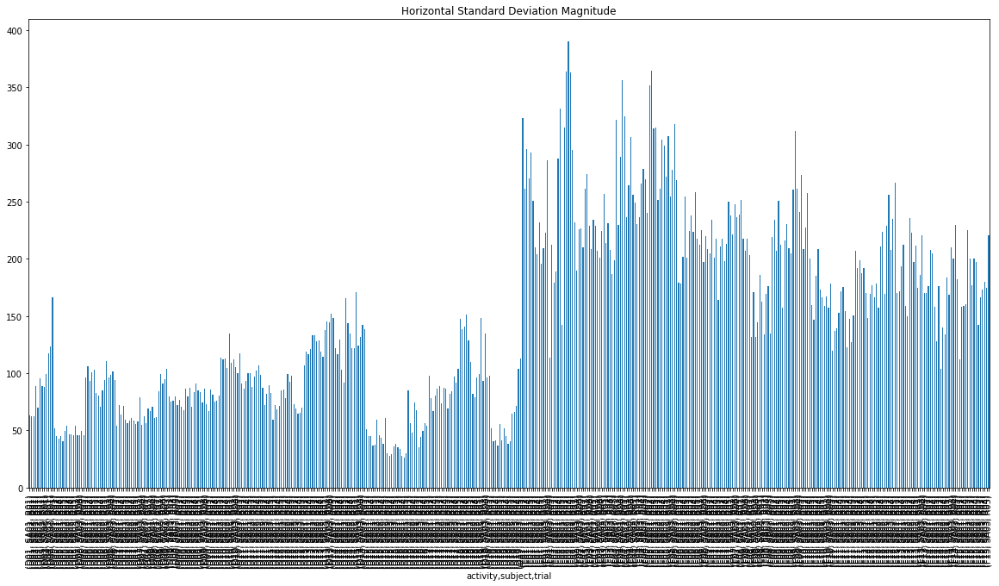

In [74]:
plt.figure(figsize=(20,10))
x = pivot3.loc[:, ('max', 'horiz_std_mag9')]
x.plot(kind='bar')
plt.title('Horizontal Standard Deviation Magnitude');

Text(0.5,1,'differential horiz_std_mag2')

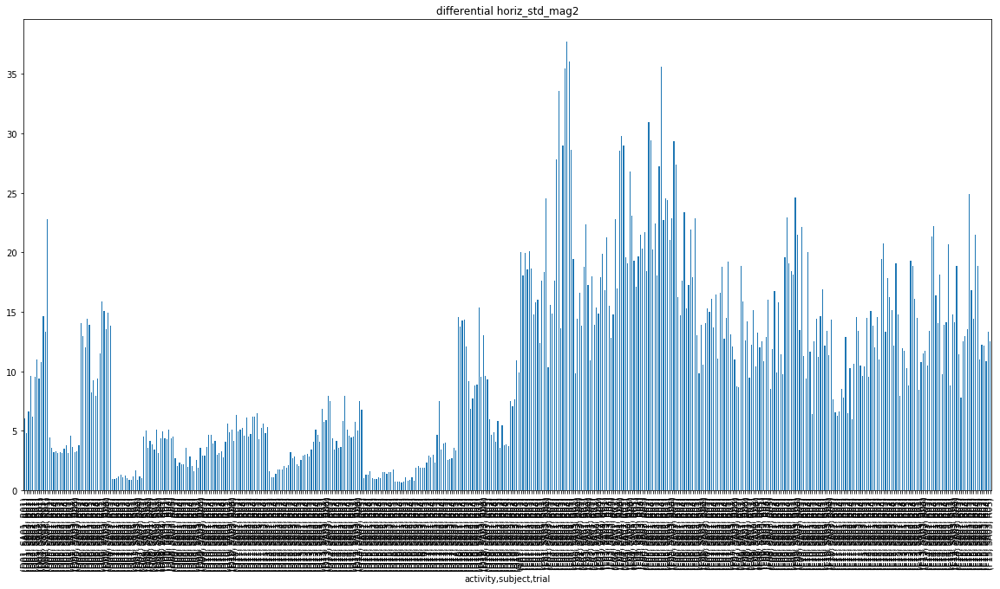

In [75]:
plt.figure(figsize=(20,10))
x = pivot3.loc[:, ('max', 'horiz_std_mag2')]
x.plot(kind='bar')
plt.title('differential horiz_std_mag2');

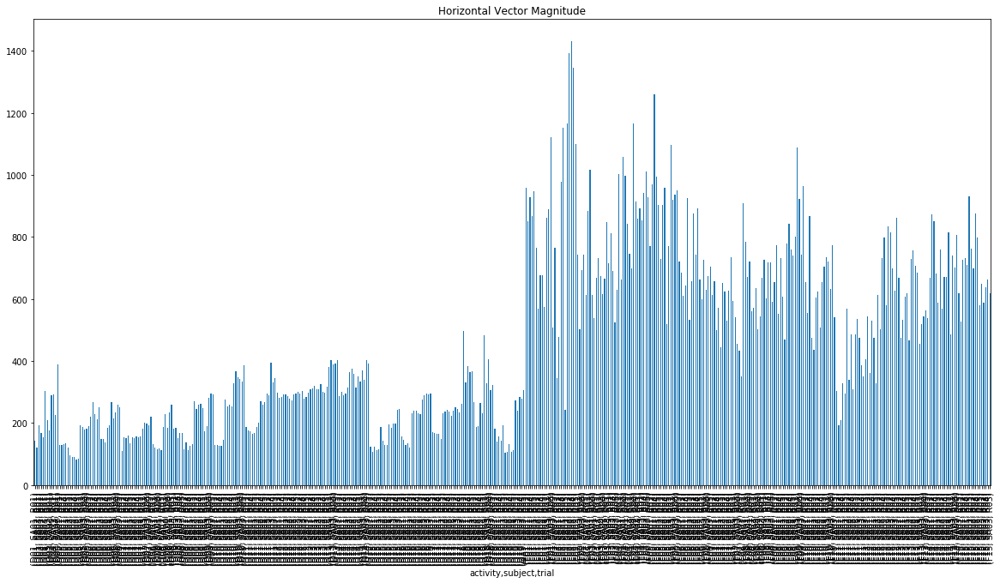

In [81]:
plt.figure(figsize=(20,10))
x = pivot3.loc[:, ('max', 'horiz_vector_mag9')]
x.plot(kind='bar');
plt.title('Horizontal Vector Magnitude')
plt.subplots_adjust(hspace=0.35);

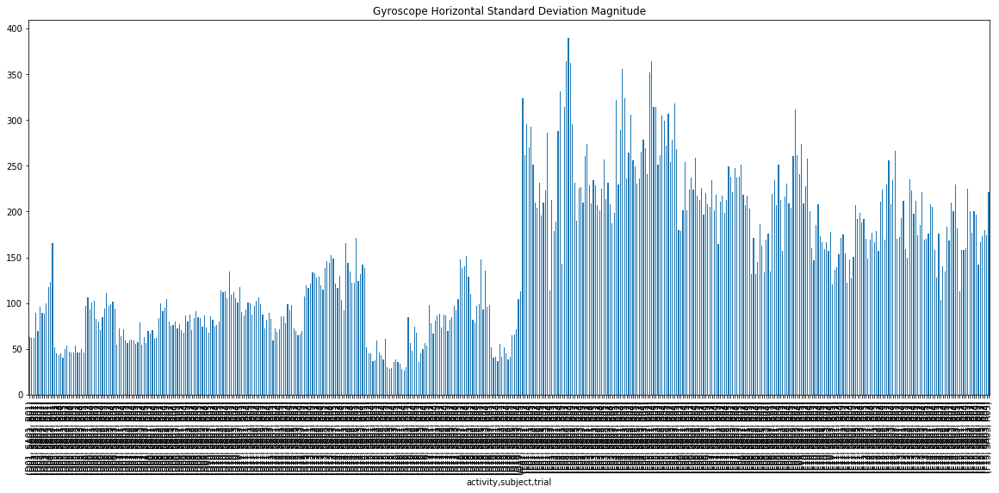

In [78]:
plt.figure(figsize=(20,8))
x = pivot3.loc[:, ('max', 'gyro_horiz_std_mag')]
x.plot(kind='bar');
plt.title('Gyroscope Horizontal Standard Deviation Magnitude');

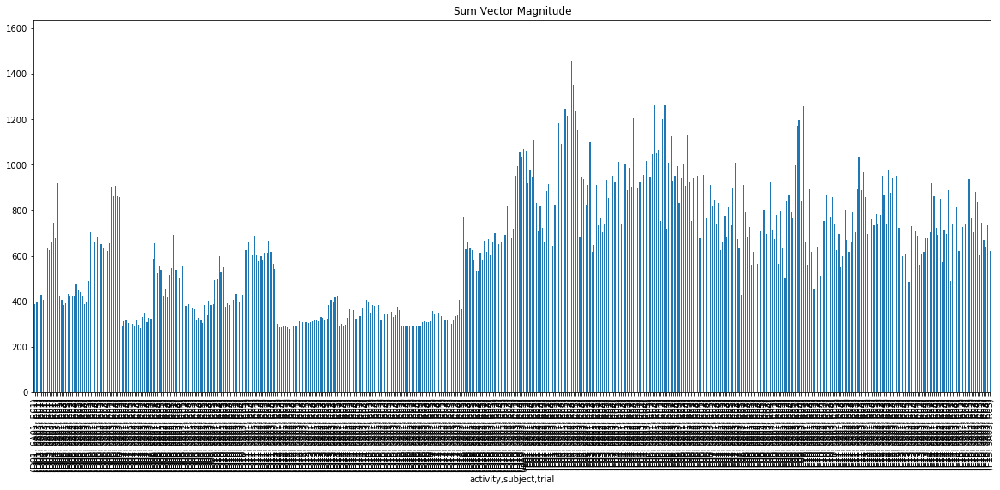

In [80]:
plt.figure(figsize=(20,8))
x = pivot3.loc[:, ('max', 'vm')]
x.plot(kind='bar')
plt.title('Sum Vector Magnitude');

Text(0.5,1,'angle from horiz')

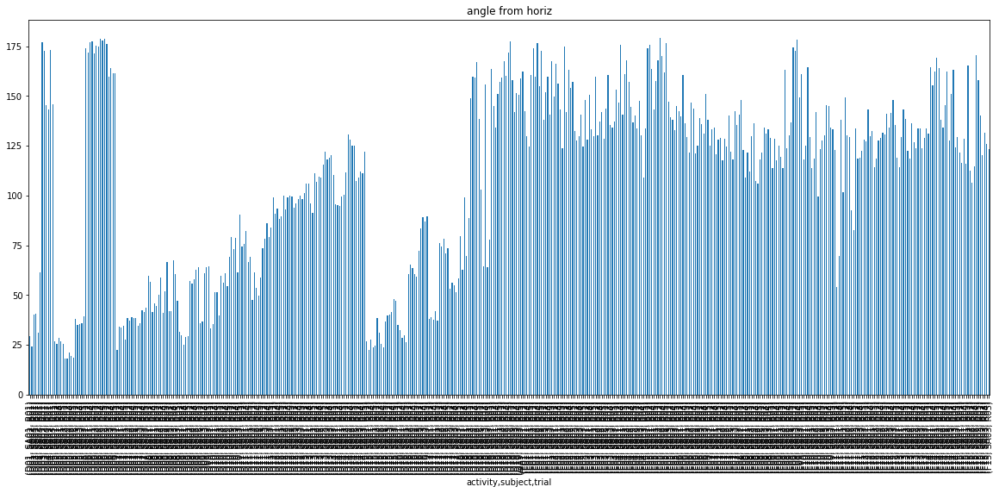

In [129]:
plt.figure(figsize=(20,8))
x = pivot3.loc[:, ('max', 'angle_from_horiz')]
x.plot(kind='bar')
plt.title('angle from horiz')

In [84]:
pivot4 = pd.pivot_table(fall_windows, index= ['activity', 'subject', 'trial'], values= vals, aggfunc= [max])

pivot4.loc[:, ('max', 'HorizSigMagArea')].min()

101.0737493553365

In [ ]:
pivot5 = pd.pivot_table(adl_windows, index= ['activity', 'subject', 'trial'], values= vals, aggfunc= [max])

pivot5.loc[:, ('max', '')].min()

**- peak_diff looks like a contendor too.**

#### Lower sensitivity:<br>
Missed: 4 (F11: trials 1,2,3 / F12: trial 2)

# Activities of Daily Life (ADLs)
- Need to fix D01-D04, clearly this isn't working

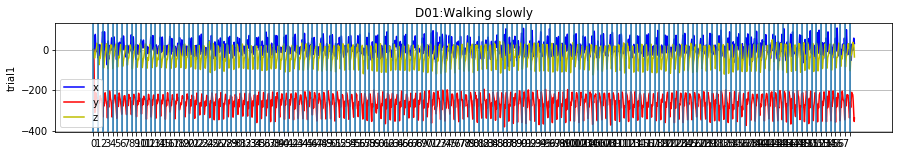

In [135]:
plot_trials(0, 'a')

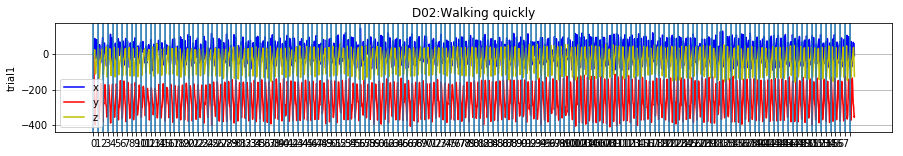

In [136]:
plot_trials(1, 'a')

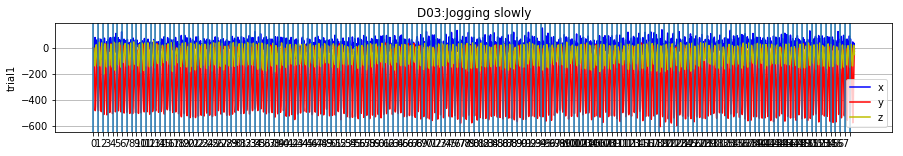

In [137]:
plot_trials(2, 'a')

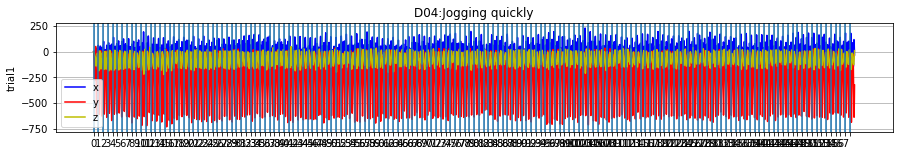

In [138]:
plot_trials(3, 'a')

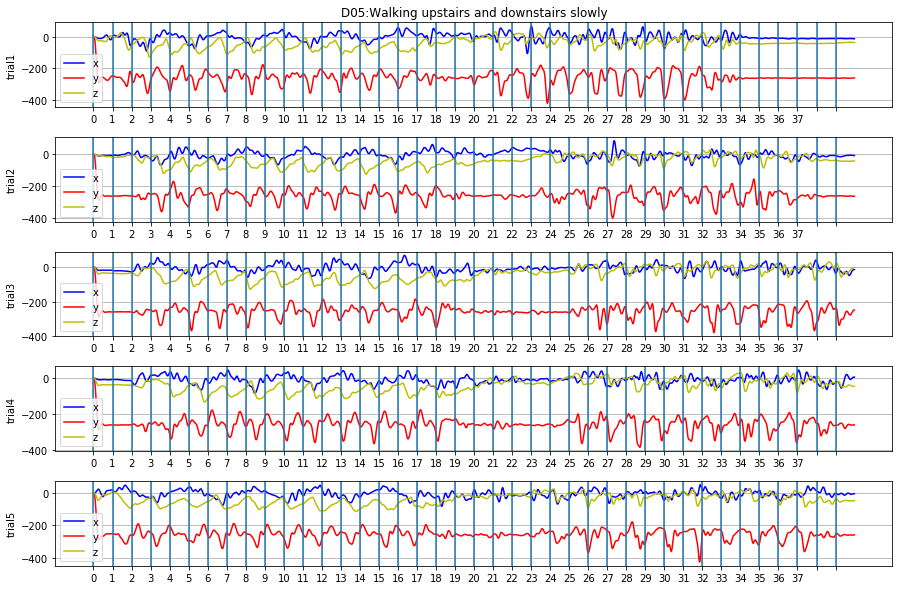

In [139]:
plot_trials(4, 'a')

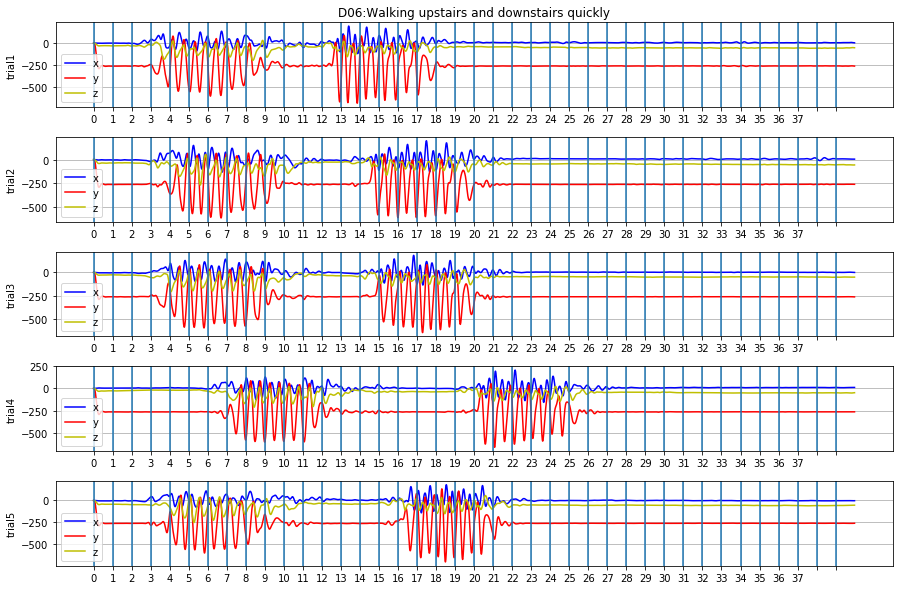

In [140]:
plot_trials(5, 'a')

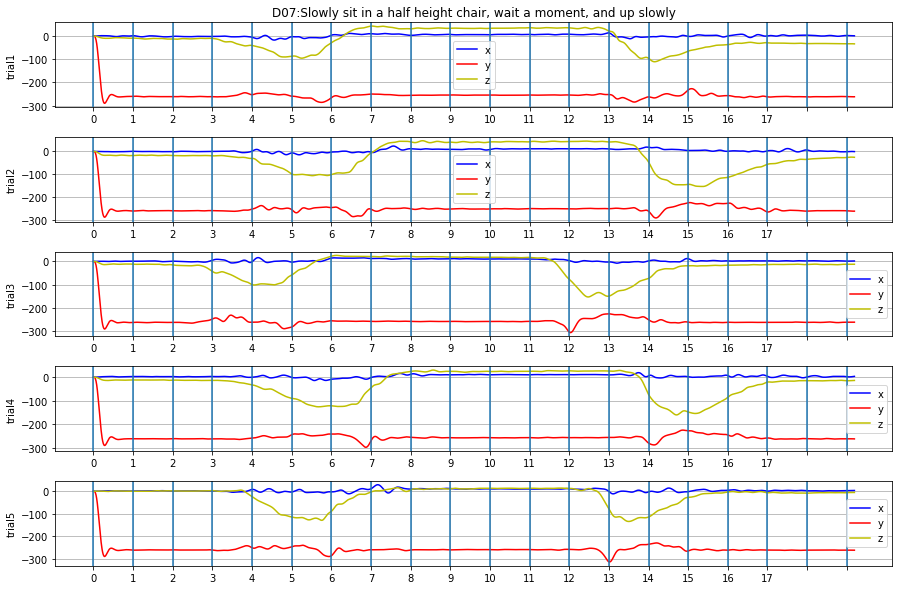

In [141]:
plot_trials(6, 'a')

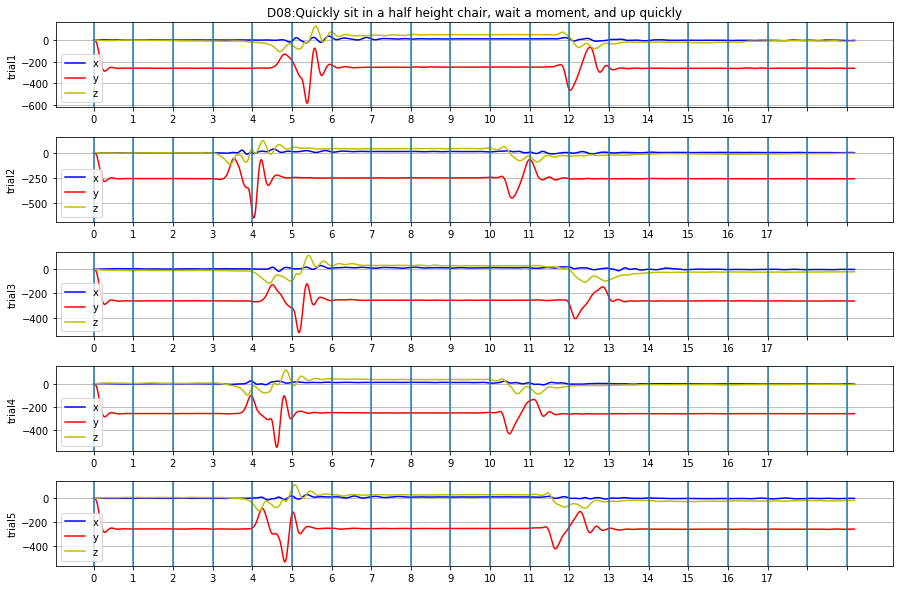

In [142]:
plot_trials(7, 'a')

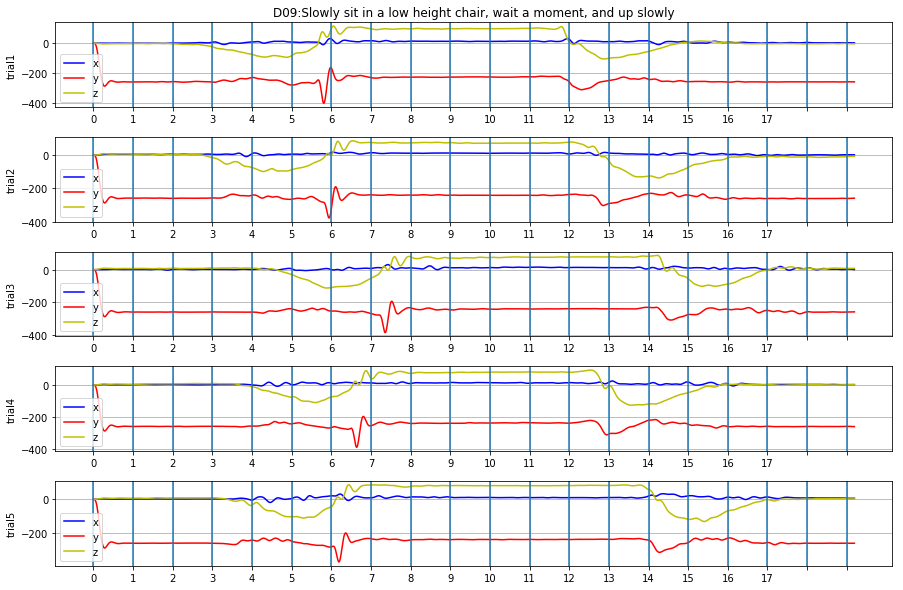

In [143]:
plot_trials(8, 'a')

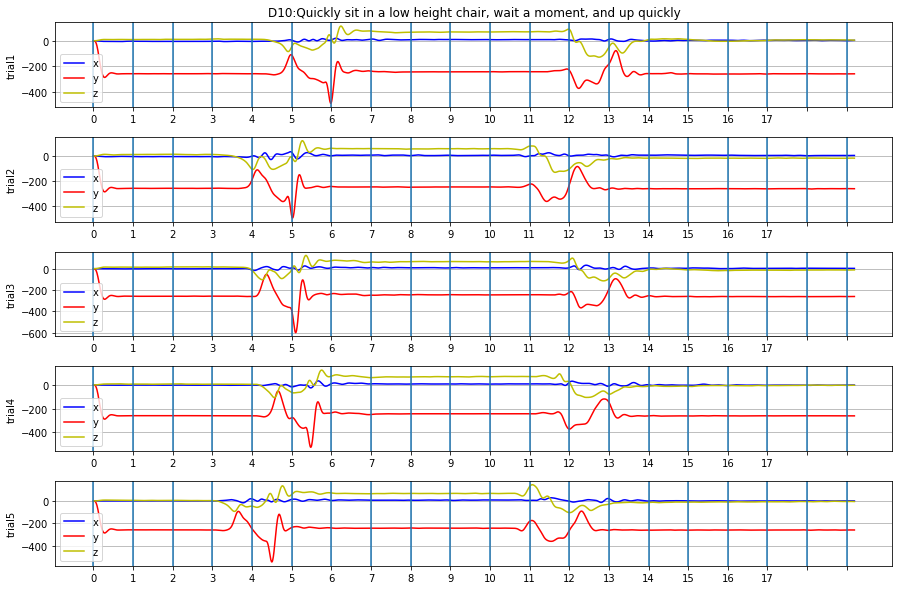

In [144]:
plot_trials(9, 'a')

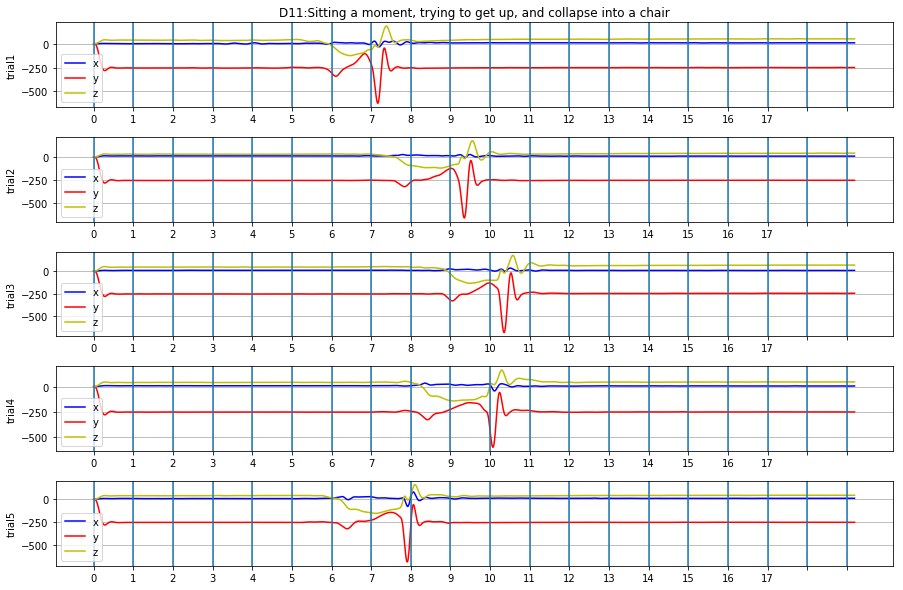

In [145]:
plot_trials(10, 'a')

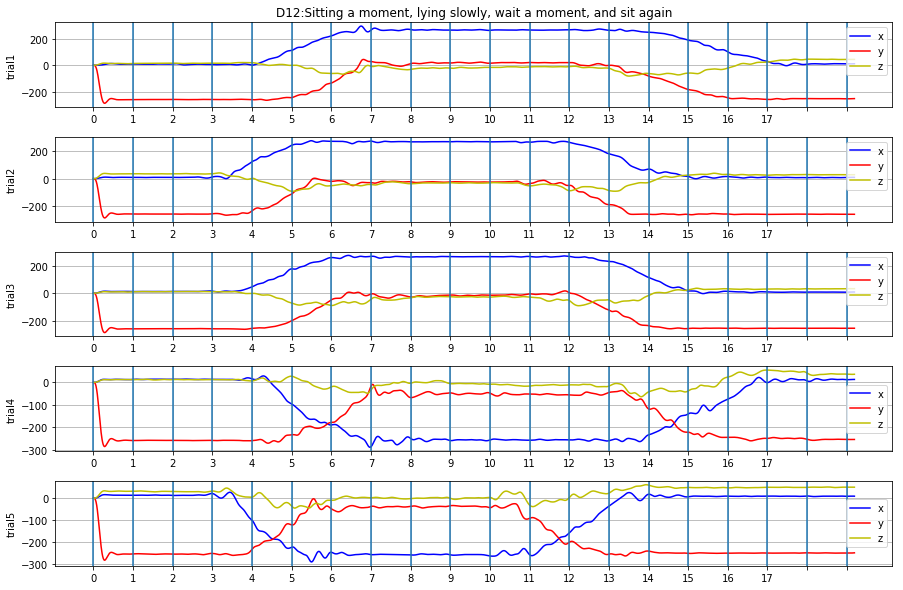

In [146]:
plot_trials(11, 'a')

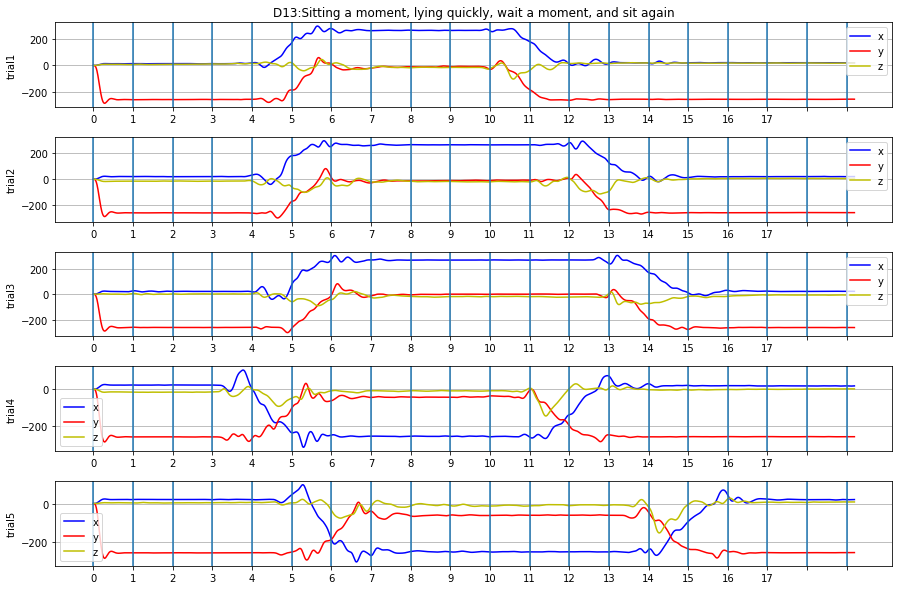

In [147]:
plot_trials(12, 'a')

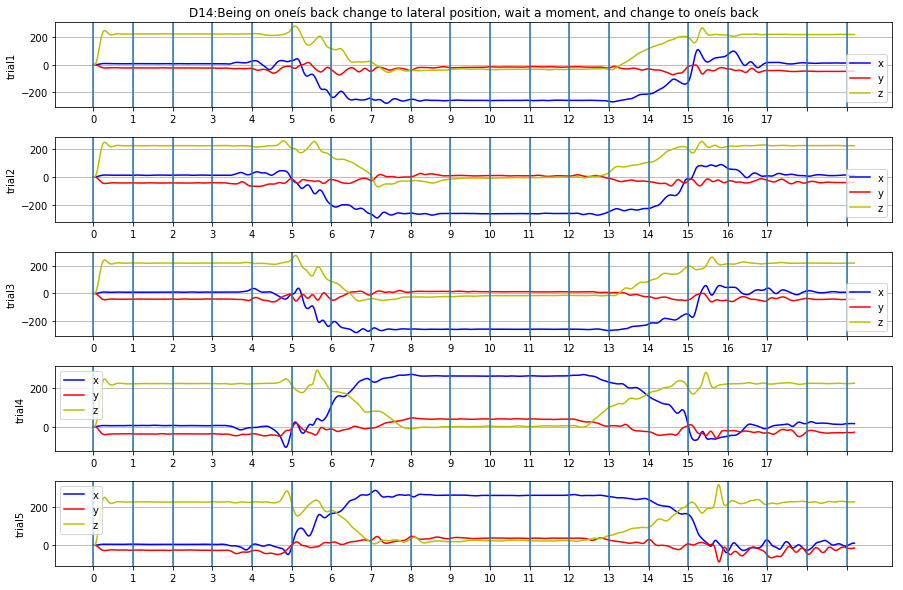

In [148]:
plot_trials(13, 'a')

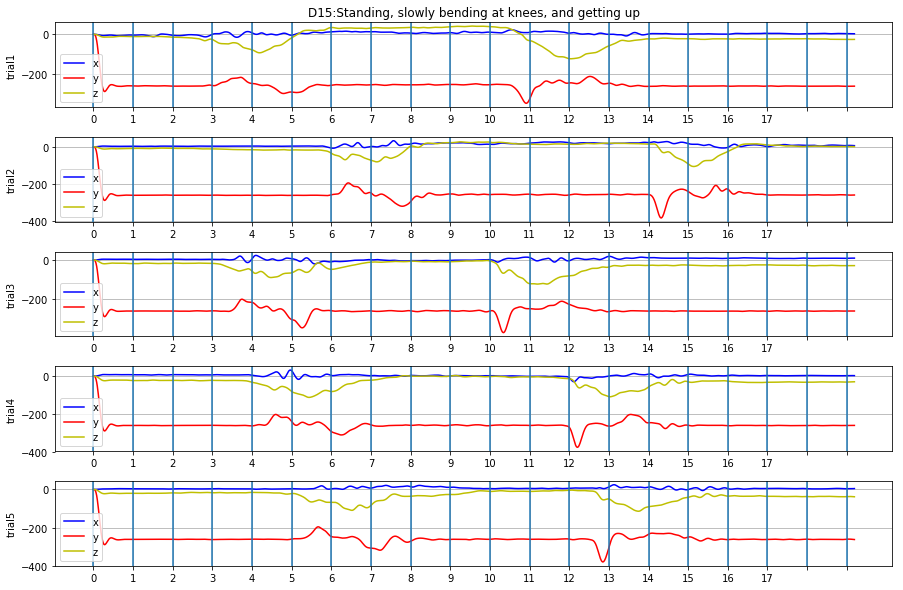

In [149]:
plot_trials(14, 'a')

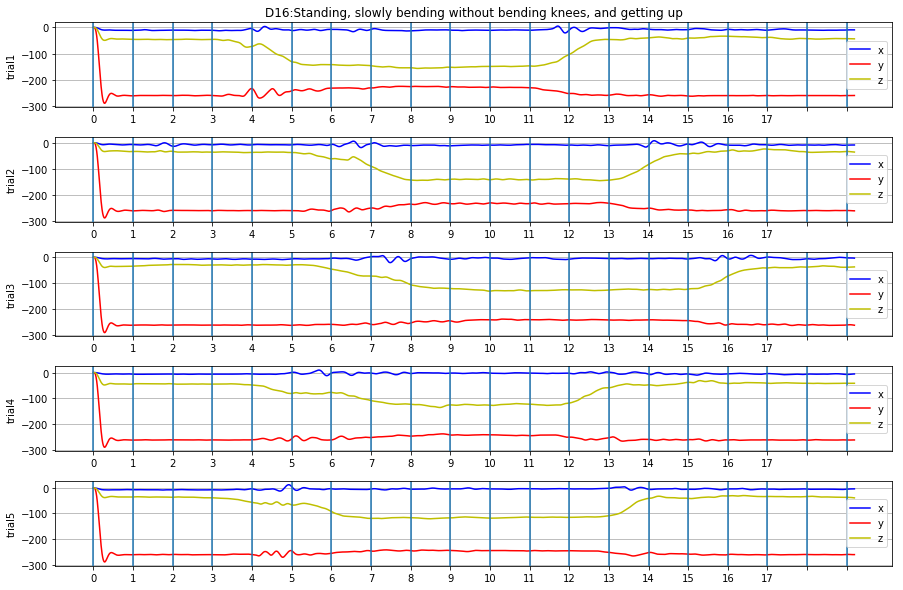

In [150]:
plot_trials(15, 'a')

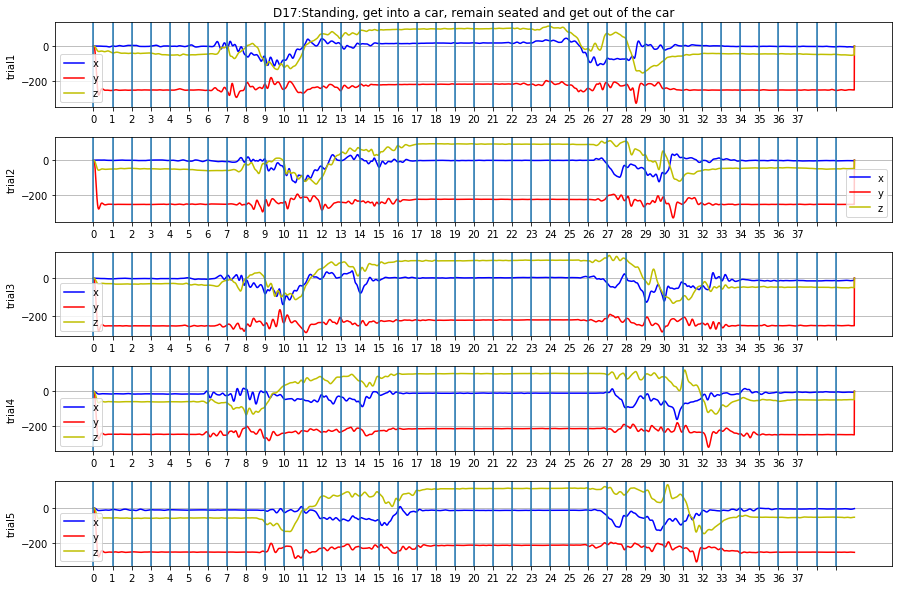

In [151]:
plot_trials(16, 'a')

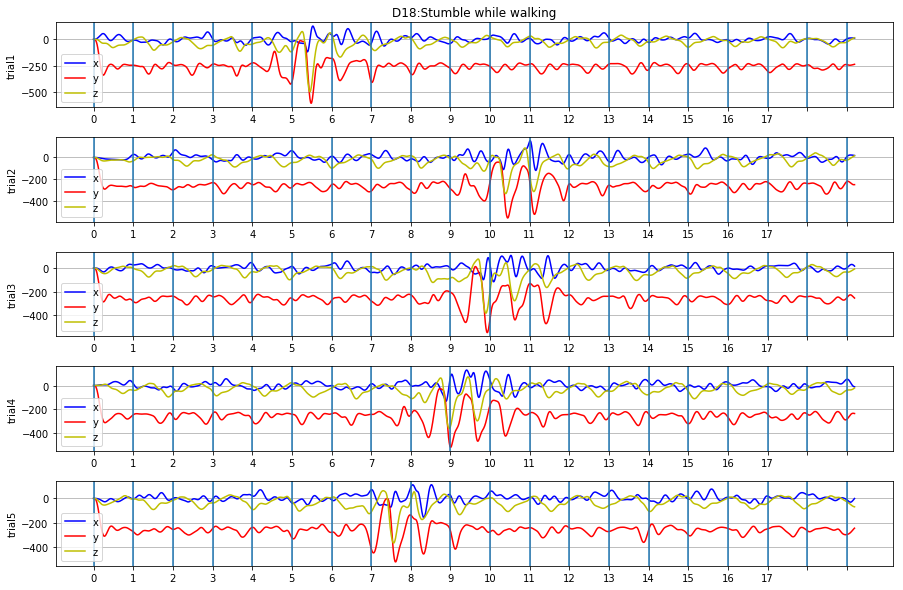

In [152]:
plot_trials(17, 'a')

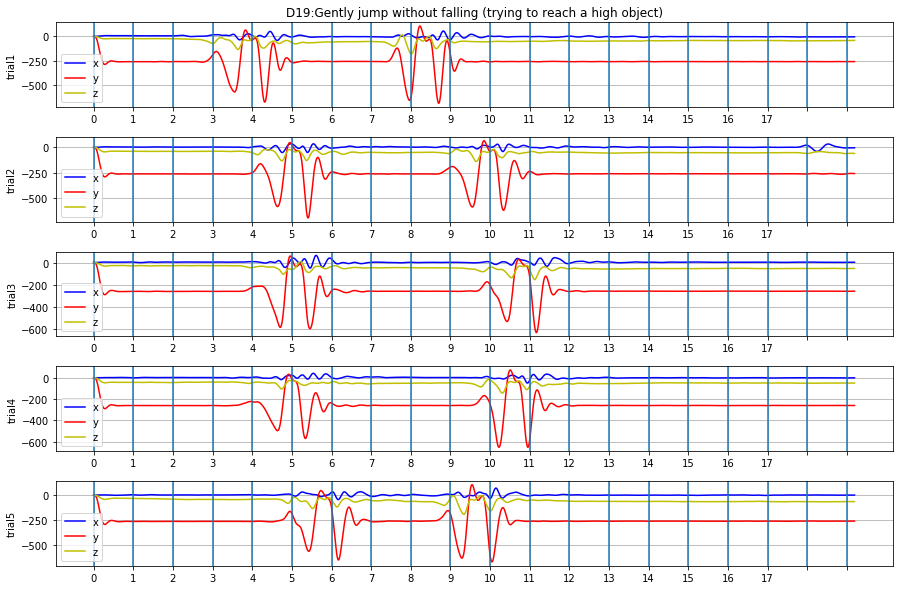

In [153]:
plot_trials(18, 'a')

**plot_feats method:**

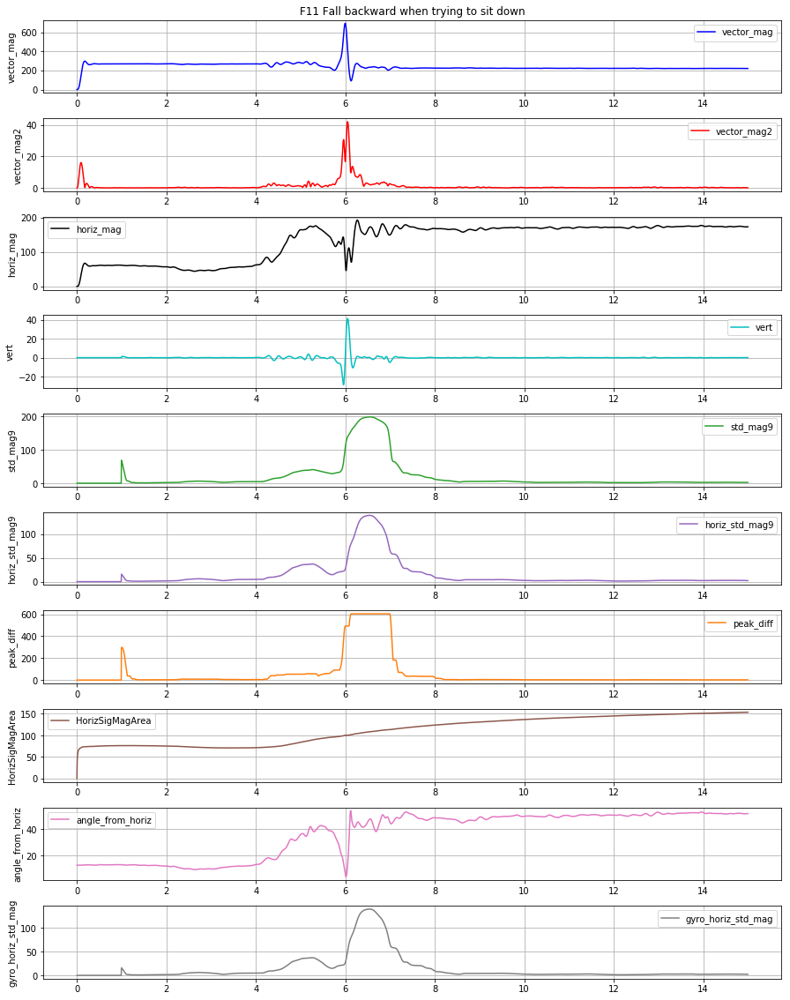

In [195]:
plot_feats(10, 1, 'f')

In [85]:
adl_windows.shape

(1697280, 51)

In [153]:
print('# windows over horizontal std mag threshold:', len(adl_windows[ adl_windows['horiz_std_mag9'] >= 170 ]))
print('# windows over horizontal vector mag threshold:',len(adl_windows[ adl_windows['horiz_vector_mag9'] >= 400 ]))
print('# windows over vector mag threshold:',len(adl_windows[ adl_windows['vm'] >= 900 ]))
print('# windows over gyro horizontal std mag threshold:',len(adl_windows[ adl_windows['gyro_horiz_std_mag'] >= 170 ]))

# windows over horizontal std mag threshold: 28
# windows over horizontal vector mag threshold: 82
# windows over vector mag threshold: 328
# windows over gyro horizontal std mag threshold: 28


In [154]:
print('# windows over horizontal std mag threshold:', len(fall_windows[ fall_windows['horiz_std_mag9'] >= 170 ]))
print('# windows over horizontal vector mag threshold:',len(fall_windows[ fall_windows['horiz_vector_mag9'] >= 400 ]))
print('# windows over vector mag threshold:',len(fall_windows[ fall_windows['vm'] >= 900 ]))
print('# windows over gyro horizontal std mag threshold:',len(fall_windows[ fall_windows['gyro_horiz_std_mag'] >= 170 ]))

# windows over horizontal std mag threshold: 55892
# windows over horizontal vector mag threshold: 11512
# windows over vector mag threshold: 1464
# windows over gyro horizontal std mag threshold: 55892


In [103]:
a = set(adl_windows[ adl_windows['horiz_std_mag9'] >= 155 ].index)
b = set(adl_windows[ adl_windows['horiz_vector_mag9'] >= 400 ].index)
c = (adl_windows[ adl_windows['vm'] >= 775 ])
d = (adl_windows[ adl_windows['gyro_horiz_std_mag'] >= 150 ])

#a_b = a

In [155]:
thresholded = adl_windows[ (adl_windows['horiz_std_mag9'] >= 170 ) & (adl_windows['horiz_vector_mag9'] >= 400 )
                          & (adl_windows['vm'] >= 900 ) & (adl_windows['gyro_horiz_std_mag'] >= 170 )]
thresholded_a2 = adl_windows[ (adl_windows['horiz_std_mag9'] >= 170 )*1 + (adl_windows['horiz_vector_mag9'] >= 400 )*1
                          + (adl_windows['vm'] >= 900 )*1 + (adl_windows['gyro_horiz_std_mag'] >= 170 )*1 >= 2]
thresholded_a3 = adl_windows[ (adl_windows['horiz_std_mag9'] >= 170 )*1 + (adl_windows['horiz_vector_mag9'] >= 400 )*1
                          + (adl_windows['vm'] >= 900 )*1 + (adl_windows['gyro_horiz_std_mag'] >= 170 )*1 >= 3]

print('all >=:', len(thresholded))
print('sum >= 2:', len(thresholded_a2))
print('sum >= 3:', len(thresholded_a3))

print(thresholded_a2['activity'].value_counts())
print(thresholded_a2['subject'].value_counts())
print(thresholded_a2['trial'].value_counts())



print(thresholded_a3['activity'].value_counts())
print(thresholded_a3['subject'].value_counts())
print(thresholded_a3['trial'].value_counts())

#thresholded_a3.groupby(['subject', 'activity', 'trial']).max()

all >=: 0
sum >= 2: 28
sum >= 3: 0
D14    28
Name: activity, dtype: int64
SA03    28
Name: subject, dtype: int64
R01    28
Name: trial, dtype: int64
Series([], Name: activity, dtype: int64)
Series([], Name: subject, dtype: int64)
Series([], Name: trial, dtype: int64)


In [156]:
thresholded_f = fall_windows[ (fall_windows['horiz_std_mag9'] >= 170 ) & (fall_windows['horiz_vector_mag9'] >= 400 )
                          & (fall_windows['vm'] >= 900 ) & (fall_windows['gyro_horiz_std_mag'] >= 170 )]

thresholded_f2 = fall_windows[ (fall_windows['horiz_std_mag9'] >= 170 )*1 + (fall_windows['horiz_vector_mag9'] >= 400 )*1
                          + (fall_windows['vm'] >= 900 )*1 + (fall_windows['gyro_horiz_std_mag'] >= 170 )*1 >= 2]
thresholded_f3 = fall_windows[ (fall_windows['horiz_std_mag9'] >= 170 )*1 + (fall_windows['horiz_vector_mag9'] >= 400 )*1
                          + (fall_windows['vm'] >= 900 )*1 + (fall_windows['gyro_horiz_std_mag'] >= 170 )*1 >= 3]

print('all >=:', len(thresholded_f))
print('sum >= 2:', len(thresholded_f2))
print('sum >= 3:', len(thresholded_f3))

all >=: 1056
sum >= 2: 56240
sum >= 3: 4430


In [115]:
print(thresholded_f['activity'].value_counts())
print(thresholded_f['subject'].value_counts())
thresholded_f.groupby(['subject', 'activity', 'trial']).max()

F05    460
F04    364
F01    290
F02    270
F09    160
F06    130
F03    126
F12     92
F07     30
F15     30
F14     30
F08     28
F10     18
Name: activity, dtype: int64
SA03    758
SA01    746
SA02    524
Name: subject, dtype: int64


ax    ay   az          fx          fy           fz  \
subject activity trial                                                        
SA01    F01      R01    112   555   66 -173.764456  485.047998  -625.628152   
                 R02     75   769 -228 -171.559604  421.024776  -637.790588   
                 R03     -1   284 -132 -288.135238  357.689187  -656.823806   
                 R04   -154   200   39 -538.601063  381.733827  -302.194803   
                 R05    255   512 -157 -417.957840  573.273617  -579.723753   
        F02      R03    157   423  270 -253.309699 -380.336697   832.843832   
                 R04    349   631  121  369.421327 -421.301082  1108.485532   
        F03      R01   -110   158   13 -737.622354 -187.248614  -199.109929   
                 R02    250   168   79 -712.254410 -338.695148  -122.548738   
                 R05     36    20  204 -544.968212 -566.515878   -47.355142   
        F04      R01    -52   143  329 -678.088415  217.922554  -334.248633   
                 R03    221    72  146 -697.193741 -306.948740   -62.119058   
                 R04    691    62  -44   49.616553   10.200338  -802.228756   
                 R05    520   277  -83  -13.348932  303.977270  -371.094665   
        F05      R01    606  1401  158 -214.050985  589.142226  -562.629658   
                 R02    117   462  447 -605.094360  398.117916  -318.802077   
                 R03    280   269  324 -733.779308   55.383863  -268.211425   
                 R04    170   860 -100 -341.609843  359.540124  -655.499330   
                 R05    211   606  326  252.279952  647.862394  -740.916248   
        F06      R02    326  -101   -1  375.736011 -661.279443   294.168688   
                 R03     54  -251   94  554.389471 -579.492430   267.789678   
                 R04    171   -45  114  921.874537 -463.072662   -35.565908   
        F08      R01     37   275  -22 -737.944702   52.148113  -320.571618   
                 R02   -148   -46  -33 -707.199738   97.973657  -315.133540   
        F10      R03    213   141  125 -783.351298  208.856025    26.712908   
        F14      R02      0   331  126  118.754794  279.265461   865.116348   
                 R03     -9   -11  111  -87.651753  171.597067   824.629988   
        F15      R05    -60    90   -6 -655.318625  -54.668283   487.993261   
SA02    F01      R01     73   261  325 -110.794413  427.823936  -686.123836   
                 R03    -87   484  -38 -181.777036  459.972982  -594.526512   
...                     ...   ...  ...         ...         ...          ...   
SA03    F03      R01   -329  -122   -4 -642.017296 -406.933021  -193.838757   
                 R02   -119   146    2 -595.252173 -529.993456  -108.402226   
                 R03   -206  -135   25 -607.463707 -481.068547  -139.314670   
                 R05    -73    -3  128 -574.750509 -514.565468  -162.240208   
        F04      R01    104    79 -173   31.139236  319.031098  -780.291075   
                 R02    191   328 -146   91.450184  235.861832  -741.281909   
                 R03    352   375 -100  283.552450  355.430841  -686.474083   
                 R04    181   275  -65  194.740897  106.227685  -756.874871   
                 R05    603   319   39  367.264428  365.437743  -616.251437   
        F05      R01    224   569    0   60.204958  457.810615  -791.629956   
                 R02    284   236   48  232.484276  345.400659  -709.742768   
                 R03    483   213 -161  316.064177  354.335460  -636.752581   
                 R04    291   358  -99  255.004179  453.673915  -638.793927   
                 R05    314  1218   -2  436.318854  530.288538  -459.062837   
        F06      R02    410   -43   92  726.101546 -543.215002    30.591972   
                 R04    162   216  219 -596.972824 -513.074281    -8.953292   
                 R05    155   -31   94 -558.681892 -529.965311  -181.113114   
        F07      R01    315   237    3  580.280027 -656.005898    -6.124859

In [138]:
testx = wList_f[0].copy()
print(testx.shape)
testx = np.array(testx)
flatx = testx.flatten()
print(flatx.shape)

(256, 51)
(13056,)


In [183]:
all_windows['subject'].value_counts()

SA02    988160
SA03    988160
SA01    988160
Name: subject, dtype: int64